<a href="https://colab.research.google.com/github/ainizamova/ASR_CourseWork/blob/main/noise_2s_en_speech_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Импортирование и установки**

In [ ]:
# необходимо для RNNT моделей
!pip install --upgrade numba --ignore-installed

# после установки перезапустить среду выполнения

     |████████████████████████████████| 3.3 MB 5.2 MB/s 
     |████████████████████████████████| 15.7 MB 247 kB/s 
     |████████████████████████████████| 34.5 MB 1.3 MB/s 
     |████████████████████████████████| 1.1 MB 40.5 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.8.0 requires tf-estimator-nightly==2.8.0.dev2021122109, which is not installed.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


In [ ]:
# Установка зависимостей
!pip install wget
!apt-get install sox libsndfile1 ffmpeg libsox-fmt-mp3
!pip install unidecode
!pip install matplotlib>=3.3.2
#!pip install --upgrade numba
# Установка NeMo
BRANCH = 'main'
!python -m pip install git+https://github.com/NVIDIA/NeMo.git@$BRANCH#egg=nemo_toolkit[all]
#!pip install --upgrade nemo_toolkit[all]

Reading package lists... Done
Building dependency tree       
Reading state information... Done
libsndfile1 is already the newest version (1.0.28-4ubuntu0.18.04.2).
ffmpeg is already the newest version (7:3.4.8-0ubuntu0.2).
libsox-fmt-mp3 is already the newest version (14.4.2-3ubuntu0.18.04.1).
sox is already the newest version (14.4.2-3ubuntu0.18.04.1).
0 upgraded, 0 newly installed, 0 to remove and 39 not upgraded.
  Cloning https://github.com/NVIDIA/NeMo.git (to revision main) to /tmp/pip-install-3_bwq8fp/nemo-toolkit_5a7fc96b1d974c7184c86fea018508ce
  Running command git clone -q https://github.com/NVIDIA/NeMo.git /tmp/pip-install-3_bwq8fp/nemo-toolkit_5a7fc96b1d974c7184c86fea018508ce
  Using cached pytorch_lightning-1.6.1-py3-none-any.whl (582 kB)
  Using cached torchmetrics-0.8.0-py3-none-any.whl (408 kB)
  Using cached pyDeprecate-0.3.2-py3-none-any.whl (10 kB)
  Created wheel for nemo-toolkit: filename=nemo_toolkit-1.9.0rc0-py3-none-any.whl size=3455821 sha256=761da0e72bae523a4

In [ ]:
# Импорт NeMo
import nemo
# Импорт коллекции по распознаванию речи
import nemo.collections.asr as nemo_asr
# для прослушивания аудио
import IPython
from nemo.collections.asr.metrics.wer import WER, word_error_rate

#from omegaconf import DictConfig, OmegaConf
#from nemo.utils.exp_manager import exp_manager

In [ ]:
# import tensorflow
# print(tensorflow.__version__)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# **Подготовка данных**

In [ ]:
!pwd

/content


In [ ]:
# Будем располагать данные в текущей директории
data_dir = '.'

In [ ]:
import glob
import os
import subprocess
import wget

In [ ]:
# Если что-то пойдет не так во время обработки данных, раскомментируйте следующую строку, чтобы удалить кэшированный набор данных 
#!rm -rf datasets/...
!mkdir -p datasets/my_en_audio

In [ ]:
import librosa
import IPython.display as ipd
# Загрузка и прослушивание аудиофайла
example_file = data_dir + '/datasets/my_en_audio/006.wav'
audio, sample_rate = librosa.load(example_file)

ipd.Audio(example_file, rate=sample_rate)

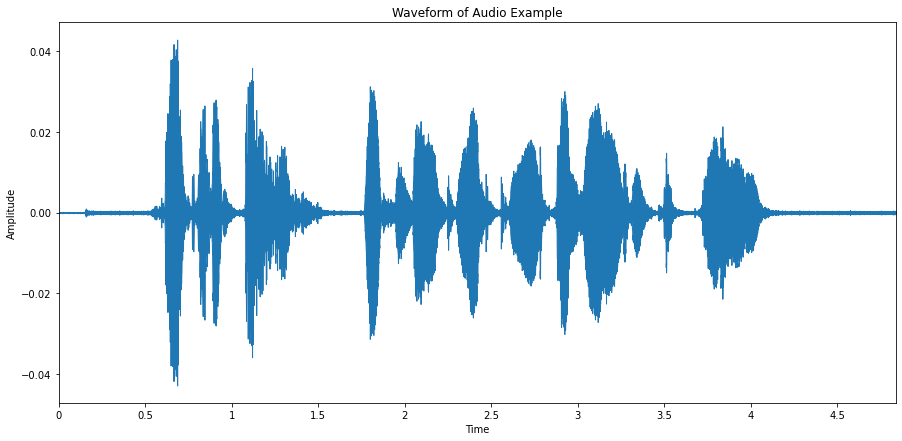

In [ ]:
%matplotlib inline
import librosa.display
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = (15,7)
plt.title('Waveform of Audio Example')
plt.ylabel('Amplitude')

_ = librosa.display.waveplot(audio)

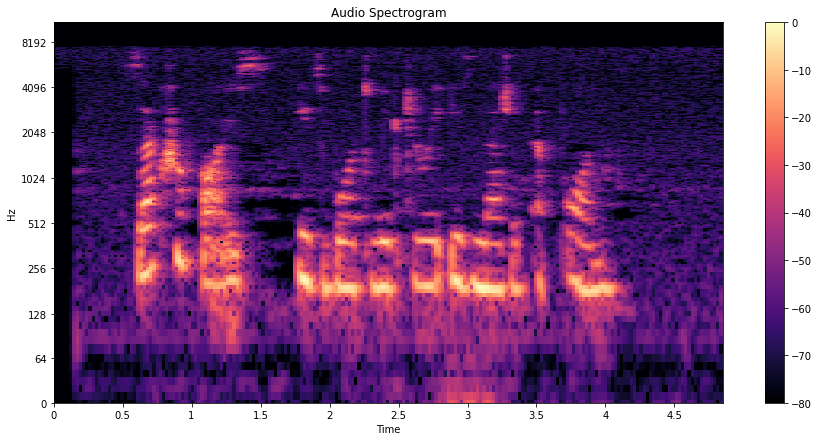

In [ ]:
import numpy as np

# Спектрограмма через кратковременное преобразование Фурье Short-Time Fourier Transform (stft)
spec = np.abs(librosa.stft(audio))
spec_db = librosa.amplitude_to_db(spec, ref=np.max)  # Децибел

# Для просмотра частот используем логарифмическую шкалу
librosa.display.specshow(spec_db, y_axis='log', x_axis='time')
plt.colorbar()
plt.title('Audio Spectrogram');

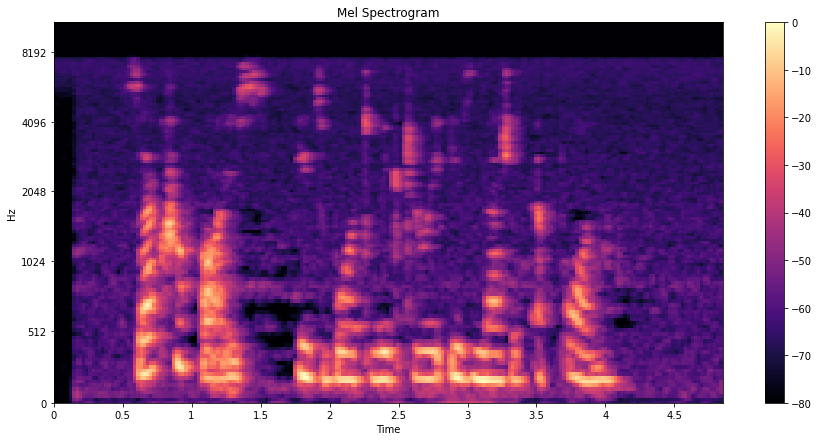

In [ ]:
# Мел-спектрограмма

mel_spec = librosa.feature.melspectrogram(audio, sr=sample_rate)
mel_spec_db = librosa.power_to_db(mel_spec, ref=np.max)

librosa.display.specshow(
    mel_spec_db, x_axis='time', y_axis='mel')
plt.colorbar()
plt.title('Mel Spectrogram');

In [ ]:
import json

# Функция для создания манифест-файлов
def build_manifest(transcripts_path, manifest_name, wav_path):
    with open(transcripts_path, 'r') as fin:
        with open(manifest_name, 'w') as fout:
            for line in fin:
                transcript = line[line.find(':')+1 : ].lower()
                transcript = transcript.strip() 

                file_id = line[ : line.find(':')]  # напр., "019"
                audio_path = os.path.join(wav_path,
                    file_id + '.wav')

                duration = librosa.core.get_duration(filename=audio_path)

                # запишем метаданные в манифест
                metadata = {
                    "audio_filepath": audio_path,
                    "duration": duration,
                    "text": transcript
                }
                json.dump(metadata, fout)
                fout.write('\n')
                
# Создание манифест-файла
print("******")
test_transcripts = data_dir + '/datasets/transcription.txt'
test_manifest = data_dir + '/test_manifest.json'
wav_path = data_dir + '/datasets/my_en_audio'

if not os.path.isfile(test_manifest):
    build_manifest(test_transcripts, "test_manifest.json" , wav_path)
    print("Test manifest created.")
print("***Done***")

******
Test manifest created.
***Done***


In [ ]:
from collections import defaultdict
from tqdm.auto import tqdm

# функция для получения символов, используемых в тексте
def get_charset(manifest_data):
    charset = defaultdict(int)
    for row in tqdm(manifest_data, desc="Computing character set"):
        text = row['text']
        for character in text:
            charset[character] += 1
    return charset

In [ ]:
def read_manifest(path):
    manifest = []
    with open(path, 'r') as f:
        for line in tqdm(f, desc="Reading manifest data"):
            line = line.replace("\n", "")
            data = json.loads(line)
            manifest.append(data)
    return manifest

In [ ]:
# функция для записи обработанного манифеста
def write_processed_manifest(data, original_path):
    original_manifest_name = os.path.basename(original_path)
    new_manifest_name = original_manifest_name.replace(".json", "_processed.json")

    manifest_dir = os.path.split(original_path)[0]
    filepath = os.path.join(manifest_dir, new_manifest_name)
    with open(filepath, 'w') as f:
        for datum in tqdm(data, desc="Writing manifest data"):
            datum = json.dumps(datum)
            f.write(f"{datum}\n")
    print(f"Finished writing manifest: {filepath}")
    return filepath

In [ ]:
test_manifest_data = read_manifest(test_manifest)

test_charset = get_charset(test_manifest_data)

Reading manifest data: 0it [00:00, ?it/s]

Computing character set:   0%|          | 0/21 [00:00<?, ?it/s]

In [ ]:
test_set = set(test_charset.keys())
print(f"Number of tokens in test set : {len(test_set)}")
print(sorted(list(test_set)))

Number of tokens in test set : 31
[' ', "'", ',', '-', '.', 'a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o', 'p', 'q', 'r', 's', 't', 'u', 'v', 'w', 'x', 'y', 'z']


Удалим из манифест-файла все"неправильные" символы (',' '-' '.'), которых нет в лейблах предобученных моделей. То есть останутся только 26 букв английского алфавита, пробел и апостроф.

In [ ]:
# Предобработка 
import re
import unicodedata

chars_to_ignore_regex = '[\,\.\-]'  # удаление лишних символов

def remove_special_characters(data):
    data["text"] = re.sub(chars_to_ignore_regex, '', data["text"]).lower().strip()
    return data

In [ ]:
# Обработка манифестов
def apply_preprocessors(manifest, preprocessors):
    for processor in preprocessors:
        for idx in tqdm(range(len(manifest)), desc=f"Applying {processor.__name__}"):
            manifest[idx] = processor(manifest[idx])

    print("Finished processing manifest !")
    return manifest

In [ ]:
PREPROCESSORS = [
    remove_special_characters
]

In [ ]:
# Загрузка манифеста
test_data = read_manifest(test_manifest)

# Применение предобработки
test_data_processed = apply_preprocessors(test_data, PREPROCESSORS)

# Создание нового манифеста без лишних символов
test_manifest_cleaned = write_processed_manifest(test_data_processed, test_manifest)

Reading manifest data: 0it [00:00, ?it/s]

Applying remove_special_characters:   0%|          | 0/21 [00:00<?, ?it/s]

Finished processing manifest !


Writing manifest data:   0%|          | 0/21 [00:00<?, ?it/s]

Finished writing manifest: ./test_manifest_processed.json


In [ ]:
def get_audio_path(manifest_path, wav_path):
  audio_paths = []
  with open(manifest_path, 'r') as fin:
    for line  in fin:
      file_id = line[line.rfind('/')+1 : line.find('.wav')]  # напр., "012"
      audio_paths.append(os.path.join(wav_path,
                    file_id + '.wav'))
  return (audio_paths)

In [ ]:
# функция для получения текста-эталона
def get_ground_truth(manifest_path):
  ground_truth_lines = []
  with open(manifest_path, 'r') as fin:
    for line  in fin:
      text = line[line.find('"text": "')+9 : line.rfind('"')]  # "только текст" без кавычек
      ground_truth_lines.append(text)
  return (ground_truth_lines)

In [ ]:
# получим эталонные тексты из манифест-файла
ground_truth_list = get_ground_truth('./test_manifest_processed.json')

In [ ]:
ground_truth_list

['she has since hosted numerous variety shows and award shows in taiwan',
 'climate change results with more health care inequalities faced by persons with disabilities',
 'then the real trouble begins',
 'he was former director and chairman of gujarat state road transport corporation',
 'add paste and stir regularly until fragrant about five minutes',
 'sacrifice is what victory is measured upon',
 'reliability precision and innovation  three attributes that nurture and sustain lasting business relationships',
 'tension is mounting as the population of the entire planet waits for the next incident',
 'they were close friends in college but after graduation their lives diverged',
 "if we'd all work together i think we could accomplish our goal",
 'doctors are complaining that the system is cumbersome and bureaucratic',
 "he retaliated his neighbor's malicious destruction of his flower garden by cutting down the man's prize apple tree",
 'a lot of chemical reactions are reversible',
 "i

In [ ]:
test_manifest_proc = './test_manifest_processed.json'

# **Добавим шум в аудиозаписи**

In [ ]:
#загрузим необходимые данные из датасета Demand, воспользовавшись скриптом от NVIDIA
if not os.path.exists("scripts/get_demand_data.py"):
  !wget -P scripts/ https://raw.githubusercontent.com/NVIDIA/NeMo/main/scripts/dataset_processing/get_demand_data.py

In [ ]:
%run -i scripts/get_demand_data.py \
    --data_root='./datasets' \
    --data_set='PRESTO'

In [ ]:
import librosa
import IPython.display as ipd
# Загрузка и прослушивание аудиофайла
example_file = data_dir + '/datasets/PRESTO/ch12.wav'
audio, sample_rate = librosa.load(example_file)

ipd.Audio(example_file, rate=sample_rate)

In [ ]:
# Подготовим манифест-файл для нарезанных фрагментов шума

def write_manifest(filepath, data_dir='./datasets/manifests/', manifest_name='noise_manifest', duration_max=None, duration_stride=1.0, filter_long=False, duration_limit=10.0):
    if duration_max is None:
        duration_max = 1e9
                
    with open(os.path.join(data_dir, manifest_name + '.json'), 'w') as fout:
        
        try:
            x, _sr = librosa.load(filepath)
            duration = librosa.get_duration(x, sr=_sr)

        except Exception:
            print(f"\n>>>>>>>>> WARNING: Librosa failed to load file {filepath}. Skipping this file !\n")
            return

        if filter_long and duration > duration_limit:
            print(f"Skipping sound sample {filepath}, exceeds duration limit of {duration_limit}")
            return

        offsets = []
        durations = []

        if duration > duration_max:
            current_offset = 0.0

            while current_offset < duration:
                difference = duration - current_offset
                segment_duration = min(duration_max, difference)

                offsets.append(current_offset)
                durations.append(segment_duration)

                current_offset += duration_stride

        else:
            offsets.append(0.0)
            durations.append(duration)


        for duration, offset in zip(durations, offsets):
            metadata = {
                'audio_filepath': filepath,
                'duration': duration,
                'label': 'noise',
                'text': '_',  
                'offset': offset,
            }

            json.dump(metadata, fout)
            fout.write('\n')
            fout.flush()

        print(f"Wrote {len(durations)} segments for filename {filename}")
            
    print("Finished preparing manifest !")

In [ ]:
from nemo.collections.asr import parts 

In [ ]:
import argparse
import copy
import json
import multiprocessing
import os
import random

import numpy as np
import soundfile as sf

from nemo.collections.asr.parts.preprocessing.segment import AudioSegment
from nemo.collections.asr.parts.preprocessing.perturb import NoisePerturbation

rng = None
att_factor = 0.8
sample_rate = 16000

In [ ]:
filename = 'ch12.wav'
filepath = os.path.join('datasets/PRESTO', filename)

In [ ]:
# Нарежем аудио ch12.wav с шумом кафетерия на 2-секундные сегменты и 
# создадим манифест-файл для шума
write_manifest(filepath, manifest_name='noise_2s', duration_max=2.0, duration_stride=2.0)

Wrote 151 segments for filename ch12.wav
Finished preparing manifest !


In [ ]:
noise_manifest_path = "/content/datasets/manifests/noise_2s.json"

!head -n 5 {noise_manifest_path}

# чтение нового манифеста PRESTO

{"audio_filepath": "datasets/PRESTO/ch12.wav", "duration": 2.0, "label": "noise", "text": "_", "offset": 0.0}
{"audio_filepath": "datasets/PRESTO/ch12.wav", "duration": 2.0, "label": "noise", "text": "_", "offset": 2.0}
{"audio_filepath": "datasets/PRESTO/ch12.wav", "duration": 2.0, "label": "noise", "text": "_", "offset": 4.0}
{"audio_filepath": "datasets/PRESTO/ch12.wav", "duration": 2.0, "label": "noise", "text": "_", "offset": 6.0}
{"audio_filepath": "datasets/PRESTO/ch12.wav", "duration": 2.0, "label": "noise", "text": "_", "offset": 8.0}


In [ ]:
def get_out_dir_name(out_dir, input_name, noise_name):
    return os.path.join(out_dir, input_name, noise_name)


def create_manifest(input_manifest, noise_manifest, out_path):
    os.makedirs(os.path.join(out_path, "manifests"), exist_ok=True)
    out_dir = get_out_dir_name(
        out_path,
        os.path.splitext(os.path.basename(input_manifest))[0],
        os.path.splitext(os.path.basename(noise_manifest))[0]
    )
    out_mfst = os.path.join(
        os.path.join(out_path, "manifests"),
        os.path.splitext(os.path.basename(input_manifest))[0]
        + "_"
        + os.path.splitext(os.path.basename(noise_manifest))[0]
        + ".json",
    )
    with open(input_manifest, "r") as inf, open(out_mfst, "w") as outf:
        for line in inf:
            row = json.loads(line.strip())
            row['audio_filepath'] = os.path.join(out_dir, os.path.basename(row['audio_filepath']))
            outf.write(json.dumps(row) + "\n")

In [ ]:
def process_row(row):
    audio_file = row['audio_filepath']
    global sample_rate
    data_orig = AudioSegment.from_file(audio_file, target_sr=sample_rate, offset=0)
    for snr in row['snrs']:
        min_snr_db = -10
        max_snr_db = 30
        global att_factor
        perturber = NoisePerturbation(
            manifest_path=row['noise_manifest'], min_snr_db=min_snr_db, max_snr_db=max_snr_db, rng=rng
        )
        out_dir = get_out_dir_name(
            row['out_dir'],
            os.path.splitext(os.path.basename(row['input_manifest']))[0],
            os.path.splitext(os.path.basename(row['noise_manifest']))[0]
        )
        os.makedirs(out_dir, exist_ok=True)
        out_f = os.path.join(out_dir, os.path.basename(audio_file))
        if os.path.exists(out_f):
            continue
        data = copy.deepcopy(data_orig)
        perturber.perturb(data)

        max_level = np.max(np.abs(data.samples))

        norm_factor = att_factor / max_level
        new_samples = norm_factor * data.samples
        sf.write(out_f, new_samples.transpose(), sample_rate)

In [ ]:
def add_noise(infile, snrs, noise_manifest, out_dir, num_workers=1):
    allrows = []

    with open(infile, "r") as inf:
        for line in inf:
            row = json.loads(line.strip())
            row['snrs'] = snrs
            row['out_dir'] = out_dir
            row['noise_manifest'] = noise_manifest
            row['input_manifest'] = infile
            allrows.append(row)
    pool = multiprocessing.Pool(num_workers)
    pool.map(process_row, allrows)
    pool.close()
    print('Done!')

In [ ]:
# наложим 2-секундные фрагменты шумного кафетерия на аудио из собственного датасета

input_manifest='/content/test_manifest_processed.json'
noise_manifest='/content/datasets/manifests/noise_2s.json'
out_dir=data_dir 
snr=[20]

add_noise(infile=input_manifest, snrs=snr, noise_manifest=noise_manifest, out_dir=out_dir, num_workers=1)
create_manifest(input_manifest=input_manifest, noise_manifest=noise_manifest, out_path=out_dir)

'''
в директории "./test_manifest_processed/noise_2s" 
будет располагаться 21 собственная аудиозапись с добавленным шумом
'''

[NeMo I 2022-04-21 11:40:28 collections:186] Dataset loaded with 151 files totalling 0.08 hours
[NeMo I 2022-04-21 11:40:28 collections:187] 0 files were filtered totalling 0.00 hours
[NeMo I 2022-04-21 11:40:29 collections:186] Dataset loaded with 151 files totalling 0.08 hours
[NeMo I 2022-04-21 11:40:29 collections:187] 0 files were filtered totalling 0.00 hours
[NeMo I 2022-04-21 11:40:29 collections:186] Dataset loaded with 151 files totalling 0.08 hours
[NeMo I 2022-04-21 11:40:29 collections:187] 0 files were filtered totalling 0.00 hours
[NeMo I 2022-04-21 11:40:29 collections:186] Dataset loaded with 151 files totalling 0.08 hours
[NeMo I 2022-04-21 11:40:29 collections:187] 0 files were filtered totalling 0.00 hours
[NeMo I 2022-04-21 11:40:30 collections:186] Dataset loaded with 151 files totalling 0.08 hours
[NeMo I 2022-04-21 11:40:30 collections:187] 0 files were filtered totalling 0.00 hours
[NeMo I 2022-04-21 11:40:30 collections:186] Dataset loaded with 151 files total

'\nв директории "./test_manifest_processed/noise_2s" \nбудет располагаться 21 собственная аудиозапись с добавленным шумом\n'

# **Различия в чистом и зашумлённом звуковых сигналах**

In [ ]:
import librosa
import IPython.display as ipd
# Загрузка и прослушивание зашумлённого аудиофайла
noisy_file = '/content/test_manifest_processed/noise_2s/014.wav'
audio, sample_rate = librosa.load(noisy_file)

ipd.Audio(noisy_file, rate=sample_rate)

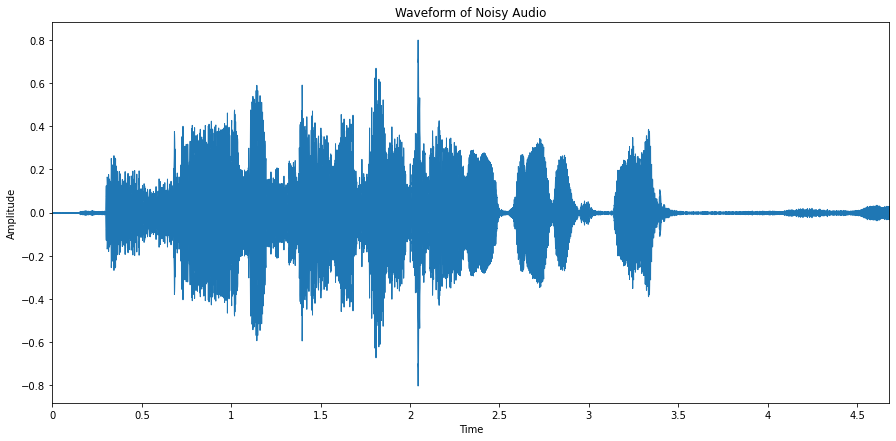

In [ ]:
%matplotlib inline
import librosa.display
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = (15,7)
plt.title('Waveform of Noisy Audio')
plt.ylabel('Amplitude')

_ = librosa.display.waveplot(audio)

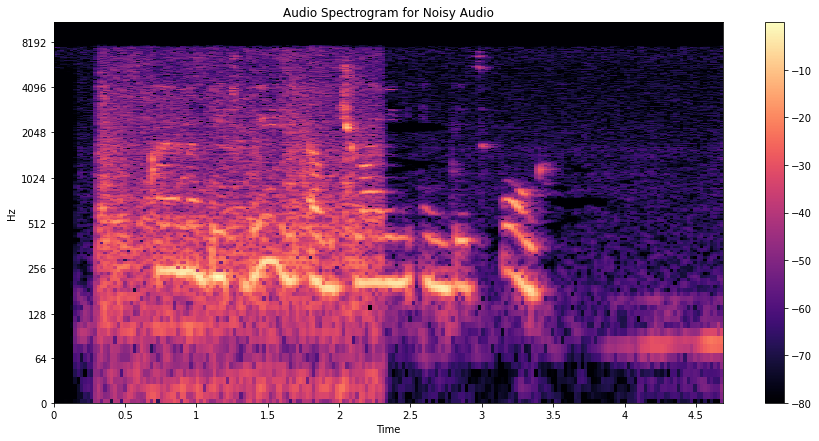

In [ ]:
import numpy as np

# Спектрограмма через кратковременное преобразование Фурье Short-Time Fourier Transform (stft)
spec = np.abs(librosa.stft(audio))
spec_db = librosa.amplitude_to_db(spec, ref=np.max)  # Децибел

# Для просмотра частот используем логарифмическую шкалу
librosa.display.specshow(spec_db, y_axis='log', x_axis='time')
plt.colorbar()
plt.title('Audio Spectrogram for Noisy Audio');

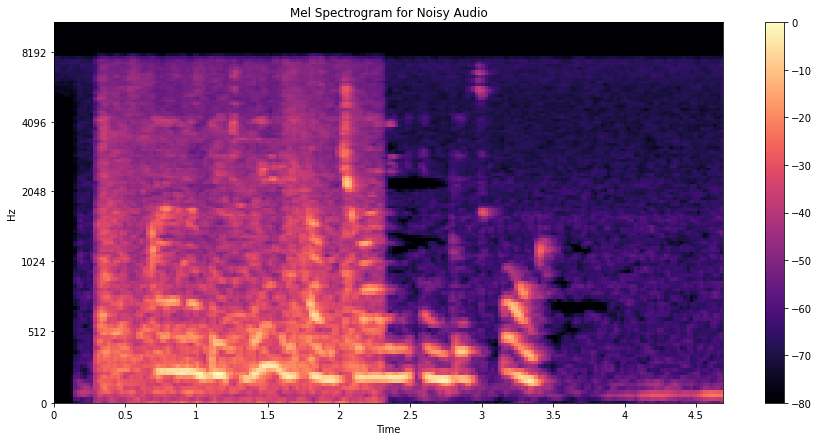

In [ ]:
# Мел-спектрограмма

mel_spec = librosa.feature.melspectrogram(audio, sr=sample_rate)
mel_spec_db = librosa.power_to_db(mel_spec, ref=np.max)

librosa.display.specshow(
    mel_spec_db, x_axis='time', y_axis='mel')
plt.colorbar()
plt.title('Mel Spectrogram for Noisy Audio');

In [ ]:
import librosa
import IPython.display as ipd
# Загрузка и прослушивание чистого аудиофайла
clean_file = '/content/datasets/my_en_audio/014.wav'
audio, sample_rate = librosa.load(clean_file)

ipd.Audio(clean_file, rate=sample_rate)

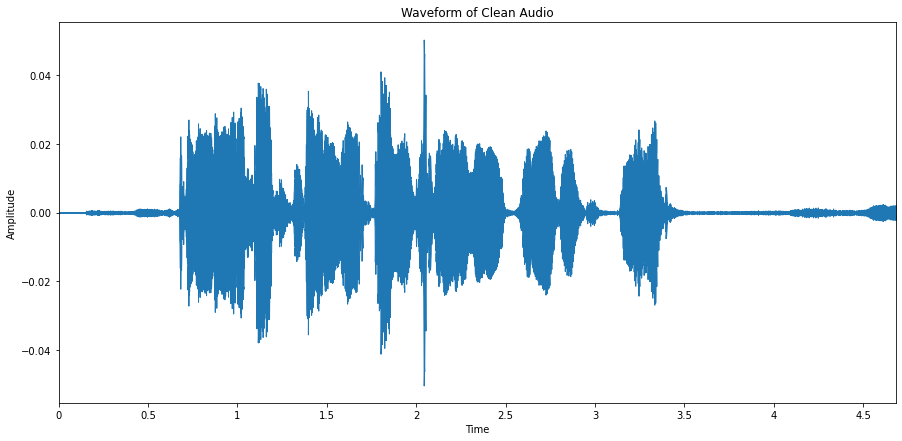

In [ ]:
%matplotlib inline
import librosa.display
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = (15,7)
plt.title('Waveform of Clean Audio')
plt.ylabel('Amplitude')

_ = librosa.display.waveplot(audio)

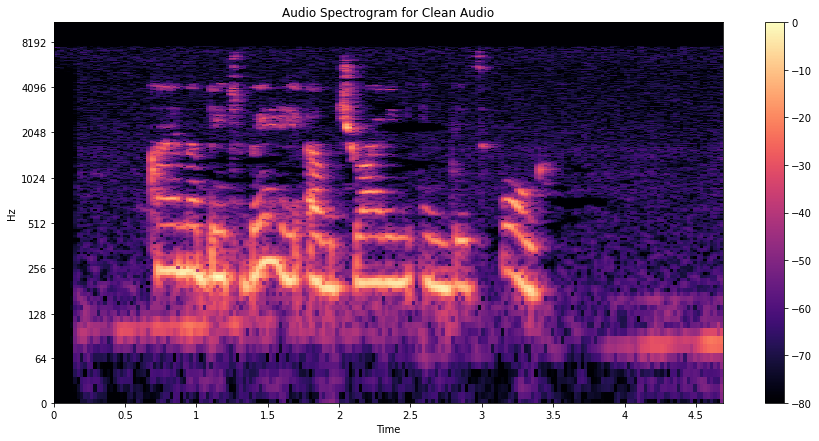

In [ ]:
import numpy as np

# Спектрограмма через кратковременное преобразование Фурье Short-Time Fourier Transform (stft)
spec = np.abs(librosa.stft(audio))
spec_db = librosa.amplitude_to_db(spec, ref=np.max)  # Децибел

# Для просмотра частот используем логарифмическую шкалу
librosa.display.specshow(spec_db, y_axis='log', x_axis='time')
plt.colorbar()
plt.title('Audio Spectrogram for Clean Audio');

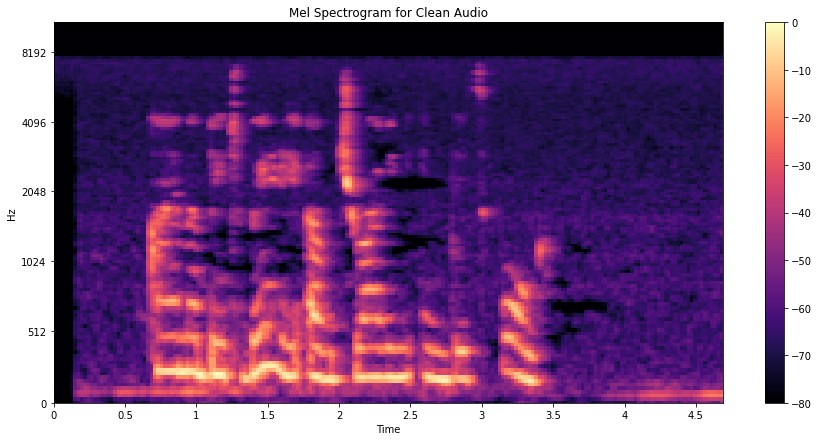

In [ ]:
# Мел-спектрограмма

mel_spec = librosa.feature.melspectrogram(audio, sr=sample_rate)
mel_spec_db = librosa.power_to_db(mel_spec, ref=np.max)

librosa.display.specshow(
    mel_spec_db, x_axis='time', y_axis='mel')
plt.colorbar()
plt.title('Mel Spectrogram for Clean Audio');

# **Тестирование различных моделей**



1.   Загрузка предобученной модели
2.   Транскрибирование
3.   Оценка WER



In [ ]:
# Создадим директорию, где будем хранить манифесты, содержащие предсказанные моделью тексты
!mkdir -p output_manifests

In [ ]:
out_manifests_path = './output_manifests'

In [ ]:
!mkdir -p scripts
if not os.path.exists("scripts/transcribe_speech.py"):
  !wget -P scripts/ https://raw.githubusercontent.com/NVIDIA/NeMo/main/examples/asr/transcribe_speech.py
if not os.path.exists("scripts/speech_to_text_eval.py"):
  !wget -P scripts/ https://raw.githubusercontent.com/NVIDIA/NeMo/main/examples/asr/speech_to_text_eval.py

--2022-04-21 11:46:38--  https://raw.githubusercontent.com/NVIDIA/NeMo/main/examples/asr/transcribe_speech.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 9755 (9.5K) [text/plain]
Saving to: ‘scripts/transcribe_speech.py’

transcribe_speech.p 100%[===================>]   9.53K  --.-KB/s    in 0s      

2022-04-21 11:46:38 (73.8 MB/s) - ‘scripts/transcribe_speech.py’ saved [9755/9755]

--2022-04-21 11:46:39--  https://raw.githubusercontent.com/NVIDIA/NeMo/main/examples/asr/speech_to_text_eval.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 

In [ ]:
noisy_wav_path = "./test_manifest_processed/noise_2s"

In [ ]:
noisy_test_files = get_audio_path("./manifests/test_manifest_processed_noise_2s.json", noisy_wav_path)

In [ ]:
noisy_test_files

['./test_manifest_processed/noise_2s/001.wav',
 './test_manifest_processed/noise_2s/002.wav',
 './test_manifest_processed/noise_2s/003.wav',
 './test_manifest_processed/noise_2s/004.wav',
 './test_manifest_processed/noise_2s/005.wav',
 './test_manifest_processed/noise_2s/006.wav',
 './test_manifest_processed/noise_2s/007.wav',
 './test_manifest_processed/noise_2s/008.wav',
 './test_manifest_processed/noise_2s/009.wav',
 './test_manifest_processed/noise_2s/010.wav',
 './test_manifest_processed/noise_2s/011.wav',
 './test_manifest_processed/noise_2s/012.wav',
 './test_manifest_processed/noise_2s/013.wav',
 './test_manifest_processed/noise_2s/014.wav',
 './test_manifest_processed/noise_2s/015.wav',
 './test_manifest_processed/noise_2s/016.wav',
 './test_manifest_processed/noise_2s/017.wav',
 './test_manifest_processed/noise_2s/018.wav',
 './test_manifest_processed/noise_2s/019.wav',
 './test_manifest_processed/noise_2s/020.wav',
 './test_manifest_processed/noise_2s/021.wav']

In [ ]:
test_manifest_proc_noise = data_dir+"/manifests/test_manifest_processed_noise_2s.json"

In [ ]:
get_ground_truth(test_manifest_proc_noise)

['she has since hosted numerous variety shows and award shows in taiwan',
 'climate change results with more health care inequalities faced by persons with disabilities',
 'then the real trouble begins',
 'he was former director and chairman of gujarat state road transport corporation',
 'add paste and stir regularly until fragrant about five minutes',
 'sacrifice is what victory is measured upon',
 'reliability precision and innovation  three attributes that nurture and sustain lasting business relationships',
 'tension is mounting as the population of the entire planet waits for the next incident',
 'they were close friends in college but after graduation their lives diverged',
 "if we'd all work together i think we could accomplish our goal",
 'doctors are complaining that the system is cumbersome and bureaucratic',
 "he retaliated his neighbor's malicious destruction of his flower garden by cutting down the man's prize apple tree",
 'a lot of chemical reactions are reversible',
 "i

## Jasper

In [ ]:
jasper_en = nemo_asr.models.EncDecCTCModel.from_pretrained(model_name="stt_en_jasper10x5dr")

[NeMo I 2022-04-21 11:47:39 cloud:66] Downloading from: https://api.ngc.nvidia.com/v2/models/nvidia/nemo/stt_en_jasper10x5dr/versions/1.0.0rc1/files/stt_en_jasper10x5dr.nemo to /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_jasper10x5dr/856ae08d5c4bd78b5e27f696e96f7aab/stt_en_jasper10x5dr.nemo
[NeMo I 2022-04-21 11:48:08 common:717] Instantiating model from pre-trained checkpoint


[NeMo W 2022-04-21 11:48:22 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 11:48:22 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    
[NeMo W 2022-04-21 11:48:23 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: /data2/voices/train_1k.json
    sample_rate: 16000
    labels:
    - ' '
    - a


[NeMo I 2022-04-21 11:48:23 features:259] PADDING: 16
[NeMo I 2022-04-21 11:48:23 features:276] STFT using torch
[NeMo I 2022-04-21 11:48:31 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 11:48:45 save_restore_connector:209] Model EncDecCTCModel was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_jasper10x5dr/856ae08d5c4bd78b5e27f696e96f7aab/stt_en_jasper10x5dr.nemo.


In [ ]:
jasper_pred = []

for fname, transcription, ground_truth in zip (noisy_test_files, jasper_en.transcribe(paths2audio_files=noisy_test_files), get_ground_truth(test_manifest_proc_noise)):
  print(f"Audio in {fname} was recognized as: {transcription}. It must be: {ground_truth}.")
  jasper_pred.append(transcription)

Transcribing:   0%|          | 0/6 [00:00<?, ?it/s]

Audio in ./test_manifest_processed/noise_2s/001.wav was recognized as: she has since hosted i humerous variety shows and awardshows in termont. It must be: she has since hosted numerous variety shows and award shows in taiwan.
Audio in ./test_manifest_processed/noise_2s/002.wav was recognized as: climate change or resolves with more healthcare inequalities placed by persons with disabilities. It must be: climate change results with more health care inequalities faced by persons with disabilities.
Audio in ./test_manifest_processed/noise_2s/003.wav was recognized as: a tan is the real trouble dekins. It must be: then the real trouble begins.
Audio in ./test_manifest_processed/noise_2s/004.wav was recognized as: he was former director and chairman of gujawat state road transport corporation. It must be: he was former director and chairman of gujarat state road transport corporation.
Audio in ./test_manifest_processed/noise_2s/005.wav was recognized as: add poast and stir regularly ar too

In [ ]:
jasper_output_manifest=out_manifests_path+"/noise_jasper_output_manifest.json"
jasper_model="stt_en_jasper10x5dr" 

In [ ]:
%run -i scripts/transcribe_speech.py \
    pretrained_name=$jasper_model \
    dataset_manifest=$test_manifest_proc_noise \
    batch_size=32 \
    amp=True \
    output_filename=$jasper_output_manifest

[NeMo I 2022-04-21 11:51:18 transcribe_speech:100] Hydra config: model_path: null
    pretrained_name: stt_en_jasper10x5dr
    audio_dir: null
    dataset_manifest: ./manifests/test_manifest_processed_noise_2s.json
    output_filename: ./output_manifests/noise_jasper_output_manifest.json
    batch_size: 32
    num_workers: 0
    cuda: null
    amp: true
    audio_type: wav
    overwrite_transcripts: true
    rnnt_decoding:
      strategy: greedy_batch
      compute_hypothesis_token_set: false
      preserve_alignments: null
      fused_batch_size: -1
      greedy:
        max_symbols_per_step: 10
        preserve_alignments: false
      beam:
        beam_size: 4
        search_type: default
        score_norm: true
        return_best_hypothesis: true
        tsd_max_sym_exp_per_step: 50
        alsd_max_target_len: 1.0
        nsc_max_timesteps_expansion: 1
        nsc_prefix_alpha: 1
        maes_num_steps: 2
        maes_prefix_alpha: 1
        maes_expansion_gamma: 2.3
        mae

[NeMo W 2022-04-21 11:51:43 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 11:51:43 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    
[NeMo W 2022-04-21 11:51:43 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: /data2/voices/train_1k.json
    sample_rate: 

[NeMo I 2022-04-21 11:51:43 features:259] PADDING: 16
[NeMo I 2022-04-21 11:51:43 features:276] STFT using torch
[NeMo I 2022-04-21 11:51:51 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 11:51:53 save_restore_connector:209] Model EncDecCTCModel was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_jasper10x5dr/856ae08d5c4bd78b5e27f696e96f7aab/stt_en_jasper10x5dr.nemo.


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


[NeMo I 2022-04-21 11:51:53 transcribe_speech:172] 
    Transcribing 21 files...
    
[NeMo I 2022-04-21 11:51:53 transcribe_speech:176] AMP enabled!
    


Transcribing:   0%|          | 0/1 [00:00<?, ?it/s]

[NeMo I 2022-04-21 11:52:10 transcribe_speech:224] Finished transcribing 21 files !
[NeMo I 2022-04-21 11:52:10 transcribe_speech:226] Writing transcriptions into file: ./output_manifests/noise_jasper_output_manifest.json
[NeMo I 2022-04-21 11:52:10 transcribe_speech:244] Finished writing predictions !


In [ ]:
%run -i scripts/speech_to_text_eval.py \
    dataset_manifest=$jasper_output_manifest \
    use_cer=False \
    only_score_manifest=True 

[NeMo I 2022-04-21 11:52:10 speech_to_text_eval:145] Got WER of 0.36764705882352944


## QuartzNet

In [ ]:
quartznet_en = nemo_asr.models.EncDecCTCModel.from_pretrained(model_name="QuartzNet15x5Base-En")

[NeMo I 2022-04-21 11:52:19 cloud:66] Downloading from: https://api.ngc.nvidia.com/v2/models/nvidia/nemospeechmodels/versions/1.0.0a5/files/QuartzNet15x5Base-En.nemo to /root/.cache/torch/NeMo/NeMo_1.9.0rc0/QuartzNet15x5Base-En/2b066be39e9294d7100fb176ec817722/QuartzNet15x5Base-En.nemo
[NeMo I 2022-04-21 11:52:23 common:717] Instantiating model from pre-trained checkpoint


[NeMo W 2022-04-21 11:52:24 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 11:52:24 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 11:52:24 features:259] PADDING: 16
[NeMo I 2022-04-21 11:52:24 features:276] STFT using torch
[NeMo I 2022-04-21 11:52:25 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 11:52:26 save_restore_connector:209] Model EncDecCTCModel was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/QuartzNet15x5Base-En/2b066be39e9294d7100fb176ec817722/QuartzNet15x5Base-En.nemo.


In [ ]:
quartznet_pred = []

for fname, transcription, ground_truth in zip (noisy_test_files, quartznet_en.transcribe(paths2audio_files=noisy_test_files), get_ground_truth(test_manifest_proc_noise)):
  print(f"Audio in {fname} was recognized as: {transcription}. It must be: {ground_truth}.")
  quartznet_pred.append(transcription)

Transcribing:   0%|          | 0/6 [00:00<?, ?it/s]

Audio in ./test_manifest_processed/noise_2s/001.wav was recognized as: she had since hosted in humerous variety shows and awatch hoses intermon. It must be: she has since hosted numerous variety shows and award shows in taiwan.
Audio in ./test_manifest_processed/noise_2s/002.wav was recognized as: climate change results with more health care inequalities praised by persons with disabilities. It must be: climate change results with more health care inequalities faced by persons with disabilities.
Audio in ./test_manifest_processed/noise_2s/003.wav was recognized as: then i a real trouble to genc. It must be: then the real trouble begins.
Audio in ./test_manifest_processed/noise_2s/004.wav was recognized as: he was former director and chilman of gujarad state road transport corporation. It must be: he was former director and chairman of gujarat state road transport corporation.
Audio in ./test_manifest_processed/noise_2s/005.wav was recognized as: add paste and stir regularly arto pragra

In [ ]:
quartznet_pred

['she had since hosted in humerous variety shows and awatch hoses intermon',
 'climate change results with more health care inequalities praised by persons with disabilities',
 'then i a real trouble to genc',
 'he was former director and chilman of gujarad state road transport corporation',
 'add paste and stir regularly arto pragrant about five minnutes',
 'cycoporis etigentlitory is magice aform',
 'reliability recession and innovation three attritutes awart imoche ansustaine lasing business relationship',
 'dension is alote an the oculation of the entire planet wate for the next incident',
 'they were close friends in college but after graduation the avise divorged',
 "if we' all worked together i think we could accomplish our goa",
 'doctors are complaining that the system is cumbersong and bureaucratic',
 "he retaliated his neighbours malisiou etruction of the flower gorden by cutting down the man's bride apple tree",
 'a lot of people maon on coversing',
 "i'm a bit weay of driv

In [ ]:
quartznet_output_manifest=out_manifests_path+"/noise_quartznet_output_manifest.json"
quartznet_model="QuartzNet15x5Base-En" 

In [ ]:
%run -i scripts/transcribe_speech.py \
    pretrained_name=$quartznet_model \
    dataset_manifest=$test_manifest_proc_noise \
    batch_size=32 \
    amp=True \
    output_filename=$quartznet_output_manifest

[NeMo I 2022-04-21 11:52:54 transcribe_speech:100] Hydra config: model_path: null
    pretrained_name: QuartzNet15x5Base-En
    audio_dir: null
    dataset_manifest: ./manifests/test_manifest_processed_noise_2s.json
    output_filename: ./output_manifests/noise_quartznet_output_manifest.json
    batch_size: 32
    num_workers: 0
    cuda: null
    amp: true
    audio_type: wav
    overwrite_transcripts: true
    rnnt_decoding:
      strategy: greedy_batch
      compute_hypothesis_token_set: false
      preserve_alignments: null
      fused_batch_size: -1
      greedy:
        max_symbols_per_step: 10
        preserve_alignments: false
      beam:
        beam_size: 4
        search_type: default
        score_norm: true
        return_best_hypothesis: true
        tsd_max_sym_exp_per_step: 50
        alsd_max_target_len: 1.0
        nsc_max_timesteps_expansion: 1
        nsc_prefix_alpha: 1
        maes_num_steps: 2
        maes_prefix_alpha: 1
        maes_expansion_gamma: 2.3
       

[NeMo W 2022-04-21 11:52:55 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 11:52:55 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 11:52:55 features:259] PADDING: 16
[NeMo I 2022-04-21 11:52:55 features:276] STFT using torch
[NeMo I 2022-04-21 11:52:56 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 11:52:56 save_restore_connector:209] Model EncDecCTCModel was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/QuartzNet15x5Base-En/2b066be39e9294d7100fb176ec817722/QuartzNet15x5Base-En.nemo.


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


[NeMo I 2022-04-21 11:52:56 transcribe_speech:172] 
    Transcribing 21 files...
    
[NeMo I 2022-04-21 11:52:56 transcribe_speech:176] AMP enabled!
    


Transcribing:   0%|          | 0/1 [00:00<?, ?it/s]

[NeMo I 2022-04-21 11:53:03 transcribe_speech:224] Finished transcribing 21 files !
[NeMo I 2022-04-21 11:53:03 transcribe_speech:226] Writing transcriptions into file: ./output_manifests/noise_quartznet_output_manifest.json
[NeMo I 2022-04-21 11:53:03 transcribe_speech:244] Finished writing predictions !


In [ ]:
%run -i scripts/speech_to_text_eval.py \
    dataset_manifest=$quartznet_output_manifest \
    use_cer=False \
    only_score_manifest=True

[NeMo I 2022-04-21 11:53:03 speech_to_text_eval:145] Got WER of 0.3382352941176471


## Citrinet 256

In [ ]:
citrinet_256 = nemo_asr.models.EncDecCTCModelBPE.from_pretrained(model_name="stt_en_citrinet_256")

[NeMo I 2022-04-21 11:53:22 cloud:66] Downloading from: https://api.ngc.nvidia.com/v2/models/nvidia/nemo/stt_en_citrinet_256/versions/1.0.0rc1/files/stt_en_citrinet_256.nemo to /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_citrinet_256/91a9cc5850784b2065e8a0aa3d526fd9/stt_en_citrinet_256.nemo
[NeMo I 2022-04-21 11:53:26 common:717] Instantiating model from pre-trained checkpoint


[NeMo W 2022-04-21 11:53:27 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 11:53:27 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 11:53:27 mixins:167] Tokenizer SentencePieceTokenizer initialized with 1024 tokens


[NeMo W 2022-04-21 11:53:28 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    trim_silence: true
    max_duration: 16.7
    shuffle: true
    is_tarred: false
    tarred_audio_filepaths: null
    use_start_end_token: false
    
[NeMo W 2022-04-21 11:53:28 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    shuffle: false
    use_start_end_token: false
    
[NeMo W 2022-04-21 11:53:28 modelPT:162] Please call the ModelPT.setup_test_data() or ModelPT.setup_multiple_test_data() method and provide a va

[NeMo I 2022-04-21 11:53:28 features:259] PADDING: 16
[NeMo I 2022-04-21 11:53:28 features:276] STFT using torch
[NeMo I 2022-04-21 11:53:29 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 11:53:30 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_citrinet_256/91a9cc5850784b2065e8a0aa3d526fd9/stt_en_citrinet_256.nemo.


In [ ]:
citrinet_256_pred = []

for fname, transcription, ground_truth in zip (noisy_test_files, citrinet_256.transcribe(paths2audio_files=noisy_test_files), get_ground_truth(test_manifest_proc_noise)):
  print(f"Audio in {fname} was recognized as: {transcription}. It must be: {ground_truth}.")
  citrinet_256_pred.append(transcription)

Transcribing:   0%|          | 0/6 [00:00<?, ?it/s]

Audio in ./test_manifest_processed/noise_2s/001.wav was recognized as: she has since hosted inumous variety shows and a watchs into month.. It must be: she has since hosted numerous variety shows and award shows in taiwan.
Audio in ./test_manifest_processed/noise_2s/002.wav was recognized as: climate change results with more healthcare inequalities faced by persons with disabilities.. It must be: climate change results with more health care inequalities faced by persons with disabilities.
Audio in ./test_manifest_processed/noise_2s/003.wav was recognized as: then the real trouble decs.. It must be: then the real trouble begins.
Audio in ./test_manifest_processed/noise_2s/004.wav was recognized as: he was former director and chairman of gerat state road transport corporation.. It must be: he was former director and chairman of gujarat state road transport corporation.
Audio in ./test_manifest_processed/noise_2s/005.wav was recognized as: add paste and stir regularly are too fragrant abo

In [ ]:
citrinet_256_output_manifest=out_manifests_path+"/noise_citrinet_256_output_manifest.json"
citrinet_256_model="stt_en_citrinet_256" 

In [ ]:
%run -i scripts/transcribe_speech.py \
    pretrained_name=$citrinet_256_model \
    dataset_manifest=$test_manifest_proc_noise \
    batch_size=32 \
    amp=True \
    output_filename=$citrinet_256_output_manifest

[NeMo I 2022-04-21 11:53:41 transcribe_speech:100] Hydra config: model_path: null
    pretrained_name: stt_en_citrinet_256
    audio_dir: null
    dataset_manifest: ./manifests/test_manifest_processed_noise_2s.json
    output_filename: ./output_manifests/noise_citrinet_256_output_manifest.json
    batch_size: 32
    num_workers: 0
    cuda: null
    amp: true
    audio_type: wav
    overwrite_transcripts: true
    rnnt_decoding:
      strategy: greedy_batch
      compute_hypothesis_token_set: false
      preserve_alignments: null
      fused_batch_size: -1
      greedy:
        max_symbols_per_step: 10
        preserve_alignments: false
      beam:
        beam_size: 4
        search_type: default
        score_norm: true
        return_best_hypothesis: true
        tsd_max_sym_exp_per_step: 50
        alsd_max_target_len: 1.0
        nsc_max_timesteps_expansion: 1
        nsc_prefix_alpha: 1
        maes_num_steps: 2
        maes_prefix_alpha: 1
        maes_expansion_gamma: 2.3
     

[NeMo W 2022-04-21 11:53:42 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 11:53:42 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 11:53:43 mixins:167] Tokenizer SentencePieceTokenizer initialized with 1024 tokens


[NeMo W 2022-04-21 11:53:43 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    trim_silence: true
    max_duration: 16.7
    shuffle: true
    is_tarred: false
    tarred_audio_filepaths: null
    use_start_end_token: false
    
[NeMo W 2022-04-21 11:53:43 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    shuffle: false
    use_start_end_token: false
    
[NeMo W 2022-04-21 11:53:43 modelPT:162] Please call the ModelPT.setup_test_data() or ModelPT.setup_multiple_test_data() method and provide a va

[NeMo I 2022-04-21 11:53:43 features:259] PADDING: 16
[NeMo I 2022-04-21 11:53:43 features:276] STFT using torch
[NeMo I 2022-04-21 11:53:45 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 11:53:45 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_citrinet_256/91a9cc5850784b2065e8a0aa3d526fd9/stt_en_citrinet_256.nemo.


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


[NeMo I 2022-04-21 11:53:45 transcribe_speech:172] 
    Transcribing 21 files...
    
[NeMo I 2022-04-21 11:53:45 transcribe_speech:176] AMP enabled!
    


Transcribing:   0%|          | 0/1 [00:00<?, ?it/s]

[NeMo I 2022-04-21 11:53:51 transcribe_speech:224] Finished transcribing 21 files !
[NeMo I 2022-04-21 11:53:51 transcribe_speech:226] Writing transcriptions into file: ./output_manifests/noise_citrinet_256_output_manifest.json
[NeMo I 2022-04-21 11:53:51 transcribe_speech:244] Finished writing predictions !


In [ ]:
%run -i scripts/speech_to_text_eval.py \
    dataset_manifest=$citrinet_256_output_manifest \
    use_cer=False \
    only_score_manifest=True 

[NeMo I 2022-04-21 11:53:51 speech_to_text_eval:145] Got WER of 0.43014705882352944


## Citrinet 512

In [ ]:
citrinet_512 = nemo_asr.models.EncDecCTCModelBPE.from_pretrained(model_name="stt_en_citrinet_512")

[NeMo I 2022-04-21 11:54:01 cloud:66] Downloading from: https://api.ngc.nvidia.com/v2/models/nvidia/nemo/stt_en_citrinet_512/versions/1.0.0rc1/files/stt_en_citrinet_512.nemo to /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_citrinet_512/3262321355385bb7cf5a583146117d77/stt_en_citrinet_512.nemo
[NeMo I 2022-04-21 11:54:08 common:717] Instantiating model from pre-trained checkpoint


[NeMo W 2022-04-21 11:54:10 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 11:54:10 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 11:54:10 mixins:167] Tokenizer SentencePieceTokenizer initialized with 1024 tokens


[NeMo W 2022-04-21 11:54:11 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    trim_silence: true
    max_duration: 16.7
    shuffle: true
    is_tarred: false
    tarred_audio_filepaths: null
    
[NeMo W 2022-04-21 11:54:11 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    shuffle: false
    
[NeMo W 2022-04-21 11:54:11 modelPT:162] Please call the ModelPT.setup_test_data() or ModelPT.setup_multiple_test_data() method and provide a valid configuration file to setup the test data loader(s).
    T

[NeMo I 2022-04-21 11:54:11 features:259] PADDING: 16
[NeMo I 2022-04-21 11:54:11 features:276] STFT using torch
[NeMo I 2022-04-21 11:54:12 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 11:54:13 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_citrinet_512/3262321355385bb7cf5a583146117d77/stt_en_citrinet_512.nemo.


In [ ]:
citrinet_512_pred = []

for fname, transcription, ground_truth in zip (noisy_test_files, citrinet_512.transcribe(paths2audio_files=noisy_test_files), get_ground_truth(test_manifest_proc_noise)):
  print(f"Audio in {fname} was recognized as: {transcription}. It must be: {ground_truth}.")
  citrinet_512_pred.append(transcription)

Transcribing:   0%|          | 0/6 [00:00<?, ?it/s]

Audio in ./test_manifest_processed/noise_2s/001.wav was recognized as: she has since hosted ngmerous variety shows and award hos in month.. It must be: she has since hosted numerous variety shows and award shows in taiwan.
Audio in ./test_manifest_processed/noise_2s/002.wav was recognized as: climate change results with more health-care inqualities rad by persons with disabilities.. It must be: climate change results with more health care inequalities faced by persons with disabilities.
Audio in ./test_manifest_processed/noise_2s/003.wav was recognized as: the then of theial trouble decreases.. It must be: then the real trouble begins.
Audio in ./test_manifest_processed/noise_2s/004.wav was recognized as: he was former director and chairman of bojavod state road transport corporation.. It must be: he was former director and chairman of gujarat state road transport corporation.
Audio in ./test_manifest_processed/noise_2s/005.wav was recognized as: add paste and stir regularly until frag

In [ ]:
citrinet_512_output_manifest=out_manifests_path+"/noise_citrinet_512_output_manifest.json"
citrinet_512_model="stt_en_citrinet_512" 

In [ ]:
%run -i scripts/transcribe_speech.py \
    pretrained_name=$citrinet_512_model \
    dataset_manifest=$test_manifest_proc_noise \
    batch_size=32 \
    amp=True \
    output_filename=$citrinet_512_output_manifest

[NeMo I 2022-04-21 11:54:24 transcribe_speech:100] Hydra config: model_path: null
    pretrained_name: stt_en_citrinet_512
    audio_dir: null
    dataset_manifest: ./manifests/test_manifest_processed_noise_2s.json
    output_filename: ./output_manifests/noise_citrinet_512_output_manifest.json
    batch_size: 32
    num_workers: 0
    cuda: null
    amp: true
    audio_type: wav
    overwrite_transcripts: true
    rnnt_decoding:
      strategy: greedy_batch
      compute_hypothesis_token_set: false
      preserve_alignments: null
      fused_batch_size: -1
      greedy:
        max_symbols_per_step: 10
        preserve_alignments: false
      beam:
        beam_size: 4
        search_type: default
        score_norm: true
        return_best_hypothesis: true
        tsd_max_sym_exp_per_step: 50
        alsd_max_target_len: 1.0
        nsc_max_timesteps_expansion: 1
        nsc_prefix_alpha: 1
        maes_num_steps: 2
        maes_prefix_alpha: 1
        maes_expansion_gamma: 2.3
     

[NeMo W 2022-04-21 11:54:27 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 11:54:27 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 11:54:27 mixins:167] Tokenizer SentencePieceTokenizer initialized with 1024 tokens


[NeMo W 2022-04-21 11:54:28 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    trim_silence: true
    max_duration: 16.7
    shuffle: true
    is_tarred: false
    tarred_audio_filepaths: null
    
[NeMo W 2022-04-21 11:54:28 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    shuffle: false
    
[NeMo W 2022-04-21 11:54:28 modelPT:162] Please call the ModelPT.setup_test_data() or ModelPT.setup_multiple_test_data() method and provide a valid configuration file to setup the test data loader(s).
    T

[NeMo I 2022-04-21 11:54:28 features:259] PADDING: 16
[NeMo I 2022-04-21 11:54:28 features:276] STFT using torch
[NeMo I 2022-04-21 11:54:29 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 11:54:30 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_citrinet_512/3262321355385bb7cf5a583146117d77/stt_en_citrinet_512.nemo.


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


[NeMo I 2022-04-21 11:54:30 transcribe_speech:172] 
    Transcribing 21 files...
    
[NeMo I 2022-04-21 11:54:30 transcribe_speech:176] AMP enabled!
    


Transcribing:   0%|          | 0/1 [00:00<?, ?it/s]

[NeMo I 2022-04-21 11:54:36 transcribe_speech:224] Finished transcribing 21 files !
[NeMo I 2022-04-21 11:54:36 transcribe_speech:226] Writing transcriptions into file: ./output_manifests/noise_citrinet_512_output_manifest.json
[NeMo I 2022-04-21 11:54:36 transcribe_speech:244] Finished writing predictions !


In [ ]:
%run -i scripts/speech_to_text_eval.py \
    dataset_manifest=$citrinet_512_output_manifest \
    use_cer=False \
    only_score_manifest=True 

[NeMo I 2022-04-21 11:54:36 speech_to_text_eval:145] Got WER of 0.3639705882352941


## Citrinet 1024


In [ ]:
citrinet_1024 = nemo_asr.models.EncDecCTCModelBPE.from_pretrained(model_name="stt_en_citrinet_1024")

[NeMo I 2022-04-21 11:56:11 cloud:66] Downloading from: https://api.ngc.nvidia.com/v2/models/nvidia/nemo/stt_en_citrinet_1024/versions/1.0.0rc1/files/stt_en_citrinet_1024.nemo to /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_citrinet_1024/86acfaf495a53383369fb6c9c547b8dd/stt_en_citrinet_1024.nemo
[NeMo I 2022-04-21 11:56:25 common:717] Instantiating model from pre-trained checkpoint


[NeMo W 2022-04-21 11:56:32 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 11:56:32 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 11:56:33 mixins:167] Tokenizer SentencePieceTokenizer initialized with 1024 tokens


[NeMo W 2022-04-21 11:56:33 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    trim_silence: true
    max_duration: 16.7
    shuffle: true
    is_tarred: false
    tarred_audio_filepaths: null
    use_start_end_token: false
    
[NeMo W 2022-04-21 11:56:33 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    shuffle: false
    use_start_end_token: false
    
[NeMo W 2022-04-21 11:56:33 modelPT:162] Please call the ModelPT.setup_test_data() or ModelPT.setup_multiple_test_data() method and provide a va

[NeMo I 2022-04-21 11:56:33 features:259] PADDING: 16
[NeMo I 2022-04-21 11:56:33 features:276] STFT using torch
[NeMo I 2022-04-21 11:56:37 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 11:56:39 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_citrinet_1024/86acfaf495a53383369fb6c9c547b8dd/stt_en_citrinet_1024.nemo.


In [ ]:
citrinet_1024_pred = []

for fname, transcription, ground_truth in zip (noisy_test_files, citrinet_1024.transcribe(paths2audio_files=noisy_test_files), get_ground_truth(test_manifest_proc_noise)):
  print(f"Audio in {fname} was recognized as: {transcription}. It must be: {ground_truth}.")
  citrinet_1024_pred.append(transcription)

Transcribing:   0%|          | 0/6 [00:00<?, ?it/s]

Audio in ./test_manifest_processed/noise_2s/001.wav was recognized as: she has since hosted numerous variety shows and a watch for inter month.. It must be: she has since hosted numerous variety shows and award shows in taiwan.
Audio in ./test_manifest_processed/noise_2s/002.wav was recognized as: climate change results with more healthcare inqualities faced by persons with disabilities.. It must be: climate change results with more health care inequalities faced by persons with disabilities.
Audio in ./test_manifest_processed/noise_2s/003.wav was recognized as: then the real trouble begins.. It must be: then the real trouble begins.
Audio in ./test_manifest_processed/noise_2s/004.wav was recognized as: he was former director and chairman of gujvaat state road transport corporation.. It must be: he was former director and chairman of gujarat state road transport corporation.
Audio in ./test_manifest_processed/noise_2s/005.wav was recognized as: add paste and stir regularly to fragrant 

In [ ]:
citrinet_1024_output_manifest=out_manifests_path+"/noise_citrinet_1024_output_manifest.json"
citrinet_1024_model="stt_en_citrinet_1024" 

In [ ]:
%run -i scripts/transcribe_speech.py \
    pretrained_name=$citrinet_1024_model \
    dataset_manifest=$test_manifest_proc_noise \
    batch_size=32 \
    amp=True \
    output_filename=$citrinet_1024_output_manifest

[NeMo I 2022-04-21 11:56:49 transcribe_speech:100] Hydra config: model_path: null
    pretrained_name: stt_en_citrinet_1024
    audio_dir: null
    dataset_manifest: ./manifests/test_manifest_processed_noise_2s.json
    output_filename: ./output_manifests/noise_citrinet_1024_output_manifest.json
    batch_size: 32
    num_workers: 0
    cuda: null
    amp: true
    audio_type: wav
    overwrite_transcripts: true
    rnnt_decoding:
      strategy: greedy_batch
      compute_hypothesis_token_set: false
      preserve_alignments: null
      fused_batch_size: -1
      greedy:
        max_symbols_per_step: 10
        preserve_alignments: false
      beam:
        beam_size: 4
        search_type: default
        score_norm: true
        return_best_hypothesis: true
        tsd_max_sym_exp_per_step: 50
        alsd_max_target_len: 1.0
        nsc_max_timesteps_expansion: 1
        nsc_prefix_alpha: 1
        maes_num_steps: 2
        maes_prefix_alpha: 1
        maes_expansion_gamma: 2.3
   

[NeMo W 2022-04-21 11:56:56 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 11:56:56 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 11:56:56 mixins:167] Tokenizer SentencePieceTokenizer initialized with 1024 tokens


[NeMo W 2022-04-21 11:56:57 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    trim_silence: true
    max_duration: 16.7
    shuffle: true
    is_tarred: false
    tarred_audio_filepaths: null
    use_start_end_token: false
    
[NeMo W 2022-04-21 11:56:57 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    shuffle: false
    use_start_end_token: false
    
[NeMo W 2022-04-21 11:56:57 modelPT:162] Please call the ModelPT.setup_test_data() or ModelPT.setup_multiple_test_data() method and provide a va

[NeMo I 2022-04-21 11:56:57 features:259] PADDING: 16
[NeMo I 2022-04-21 11:56:57 features:276] STFT using torch
[NeMo I 2022-04-21 11:57:01 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 11:57:02 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_citrinet_1024/86acfaf495a53383369fb6c9c547b8dd/stt_en_citrinet_1024.nemo.


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


[NeMo I 2022-04-21 11:57:02 transcribe_speech:172] 
    Transcribing 21 files...
    
[NeMo I 2022-04-21 11:57:02 transcribe_speech:176] AMP enabled!
    


Transcribing:   0%|          | 0/1 [00:00<?, ?it/s]

[NeMo I 2022-04-21 11:57:11 transcribe_speech:224] Finished transcribing 21 files !
[NeMo I 2022-04-21 11:57:11 transcribe_speech:226] Writing transcriptions into file: ./output_manifests/noise_citrinet_1024_output_manifest.json
[NeMo I 2022-04-21 11:57:11 transcribe_speech:244] Finished writing predictions !


In [ ]:
%run -i scripts/speech_to_text_eval.py \
    dataset_manifest=$citrinet_1024_output_manifest \
    use_cer=False \
    only_score_manifest=True 

[NeMo I 2022-04-21 11:57:11 speech_to_text_eval:145] Got WER of 0.3014705882352941


## Citrinet 256 gamma 0.25

In [ ]:
citrinet_256_gamma = nemo_asr.models.EncDecCTCModelBPE.from_pretrained(model_name="stt_en_citrinet_256_gamma_0_25")

[NeMo I 2022-04-21 11:57:55 cloud:66] Downloading from: https://api.ngc.nvidia.com/v2/models/nvidia/nemo/stt_en_citrinet_256_gamma_0_25/versions/1.0.0/files/stt_en_citrinet_256_gamma_0_25.nemo to /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_citrinet_256_gamma_0_25/d6eff3868f2f7a4791eb935c8366fc46/stt_en_citrinet_256_gamma_0_25.nemo
[NeMo I 2022-04-21 11:57:58 common:717] Instantiating model from pre-trained checkpoint


[NeMo W 2022-04-21 11:57:59 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 11:57:59 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 11:57:59 mixins:167] Tokenizer SentencePieceTokenizer initialized with 1024 tokens


[NeMo W 2022-04-21 11:58:00 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    trim_silence: false
    max_duration: 20.0
    shuffle: true
    is_tarred: false
    tarred_audio_filepaths: null
    use_start_end_token: false
    
[NeMo W 2022-04-21 11:58:00 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    shuffle: false
    use_start_end_token: false
    
[NeMo W 2022-04-21 11:58:00 modelPT:162] Please call the ModelPT.setup_test_data() or ModelPT.setup_multiple_test_data() method and provide a v

[NeMo I 2022-04-21 11:58:00 features:259] PADDING: 16
[NeMo I 2022-04-21 11:58:00 features:276] STFT using torch
[NeMo I 2022-04-21 11:58:01 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 11:58:02 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_citrinet_256_gamma_0_25/d6eff3868f2f7a4791eb935c8366fc46/stt_en_citrinet_256_gamma_0_25.nemo.


In [ ]:
citrinet_256_gamma_pred = []

for fname, transcription, ground_truth in zip (noisy_test_files, citrinet_256_gamma.transcribe(paths2audio_files=noisy_test_files), get_ground_truth(test_manifest_proc_noise)):
  print(f"Audio in {fname} was recognized as: {transcription}. It must be: {ground_truth}.")
  citrinet_256_gamma_pred.append(transcription)

Transcribing:   0%|          | 0/6 [00:00<?, ?it/s]

Audio in ./test_manifest_processed/noise_2s/001.wav was recognized as: she has since hosted nusmerous variety shows and a watchfuls in ten one. It must be: she has since hosted numerous variety shows and award shows in taiwan.
Audio in ./test_manifest_processed/noise_2s/002.wav was recognized as: climate change results with more health care and qualities faced by persons with disabilities. It must be: climate change results with more health care inequalities faced by persons with disabilities.
Audio in ./test_manifest_processed/noise_2s/003.wav was recognized as: then of the real trouble degs. It must be: then the real trouble begins.
Audio in ./test_manifest_processed/noise_2s/004.wav was recognized as: he was former director and chaerman of bujarat state road transport corporation. It must be: he was former director and chairman of gujarat state road transport corporation.
Audio in ./test_manifest_processed/noise_2s/005.wav was recognized as: add pased and stir regularly or to fragra

In [ ]:
citrinet_256_gamma_output_manifest=out_manifests_path+"/noise_citrinet_256_gamma_output_manifest.json"
citrinet_256_gamma_model="stt_en_citrinet_256_gamma_0_25" 

In [ ]:
%run -i scripts/transcribe_speech.py \
    pretrained_name=$citrinet_256_gamma_model \
    dataset_manifest=$test_manifest_proc_noise \
    batch_size=32 \
    amp=True \
    output_filename=$citrinet_256_gamma_output_manifest

[NeMo I 2022-04-21 11:58:07 transcribe_speech:100] Hydra config: model_path: null
    pretrained_name: stt_en_citrinet_256_gamma_0_25
    audio_dir: null
    dataset_manifest: ./manifests/test_manifest_processed_noise_2s.json
    output_filename: ./output_manifests/noise_citrinet_256_gamma_output_manifest.json
    batch_size: 32
    num_workers: 0
    cuda: null
    amp: true
    audio_type: wav
    overwrite_transcripts: true
    rnnt_decoding:
      strategy: greedy_batch
      compute_hypothesis_token_set: false
      preserve_alignments: null
      fused_batch_size: -1
      greedy:
        max_symbols_per_step: 10
        preserve_alignments: false
      beam:
        beam_size: 4
        search_type: default
        score_norm: true
        return_best_hypothesis: true
        tsd_max_sym_exp_per_step: 50
        alsd_max_target_len: 1.0
        nsc_max_timesteps_expansion: 1
        nsc_prefix_alpha: 1
        maes_num_steps: 2
        maes_prefix_alpha: 1
        maes_expansion

[NeMo W 2022-04-21 11:58:08 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 11:58:08 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 11:58:08 mixins:167] Tokenizer SentencePieceTokenizer initialized with 1024 tokens


[NeMo W 2022-04-21 11:58:09 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    trim_silence: false
    max_duration: 20.0
    shuffle: true
    is_tarred: false
    tarred_audio_filepaths: null
    use_start_end_token: false
    
[NeMo W 2022-04-21 11:58:09 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    shuffle: false
    use_start_end_token: false
    
[NeMo W 2022-04-21 11:58:09 modelPT:162] Please call the ModelPT.setup_test_data() or ModelPT.setup_multiple_test_data() method and provide a v

[NeMo I 2022-04-21 11:58:09 features:259] PADDING: 16
[NeMo I 2022-04-21 11:58:09 features:276] STFT using torch
[NeMo I 2022-04-21 11:58:10 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 11:58:11 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_citrinet_256_gamma_0_25/d6eff3868f2f7a4791eb935c8366fc46/stt_en_citrinet_256_gamma_0_25.nemo.


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


[NeMo I 2022-04-21 11:58:11 transcribe_speech:172] 
    Transcribing 21 files...
    
[NeMo I 2022-04-21 11:58:11 transcribe_speech:176] AMP enabled!
    


Transcribing:   0%|          | 0/1 [00:00<?, ?it/s]

[NeMo I 2022-04-21 11:58:16 transcribe_speech:224] Finished transcribing 21 files !
[NeMo I 2022-04-21 11:58:16 transcribe_speech:226] Writing transcriptions into file: ./output_manifests/noise_citrinet_256_gamma_output_manifest.json
[NeMo I 2022-04-21 11:58:16 transcribe_speech:244] Finished writing predictions !


In [ ]:
%run -i scripts/speech_to_text_eval.py \
    dataset_manifest=$citrinet_256_gamma_output_manifest \
    use_cer=False \
    only_score_manifest=True 

[NeMo I 2022-04-21 11:58:16 speech_to_text_eval:145] Got WER of 0.3235294117647059


## Citrinet 512 gamma 0.25

In [ ]:
citrinet_512_gamma = nemo_asr.models.EncDecCTCModelBPE.from_pretrained(model_name="stt_en_citrinet_512_gamma_0_25")

[NeMo I 2022-04-21 11:58:22 cloud:66] Downloading from: https://api.ngc.nvidia.com/v2/models/nvidia/nemo/stt_en_citrinet_512_gamma_0_25/versions/1.0.0/files/stt_en_citrinet_512_gamma_0_25.nemo to /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_citrinet_512_gamma_0_25/1497f738f22b48b92849481b7b5100e4/stt_en_citrinet_512_gamma_0_25.nemo
[NeMo I 2022-04-21 11:58:27 common:717] Instantiating model from pre-trained checkpoint


[NeMo W 2022-04-21 11:58:29 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 11:58:29 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 11:58:30 mixins:167] Tokenizer SentencePieceTokenizer initialized with 1024 tokens


[NeMo W 2022-04-21 11:58:30 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    trim_silence: false
    max_duration: 20.0
    shuffle: true
    is_tarred: false
    tarred_audio_filepaths: null
    use_start_end_token: false
    
[NeMo W 2022-04-21 11:58:30 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    shuffle: false
    use_start_end_token: false
    
[NeMo W 2022-04-21 11:58:30 modelPT:162] Please call the ModelPT.setup_test_data() or ModelPT.setup_multiple_test_data() method and provide a v

[NeMo I 2022-04-21 11:58:30 features:259] PADDING: 16
[NeMo I 2022-04-21 11:58:30 features:276] STFT using torch
[NeMo I 2022-04-21 11:58:32 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 11:58:33 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_citrinet_512_gamma_0_25/1497f738f22b48b92849481b7b5100e4/stt_en_citrinet_512_gamma_0_25.nemo.


In [ ]:
citrinet_512_gamma_pred = []

for fname, transcription, ground_truth in zip (noisy_test_files, citrinet_512_gamma.transcribe(paths2audio_files=noisy_test_files), get_ground_truth(test_manifest_proc_noise)):
  print(f"Audio in {fname} was recognized as: {transcription}. It must be: {ground_truth}.")
  citrinet_512_gamma_pred.append(transcription)

Transcribing:   0%|          | 0/6 [00:00<?, ?it/s]

Audio in ./test_manifest_processed/noise_2s/001.wav was recognized as: she had since hosted numerous variety shows and award rolls in tew. It must be: she has since hosted numerous variety shows and award shows in taiwan.
Audio in ./test_manifest_processed/noise_2s/002.wav was recognized as: climate change results with more health care inqualities faced by persons with disabilities. It must be: climate change results with more health care inequalities faced by persons with disabilities.
Audio in ./test_manifest_processed/noise_2s/003.wav was recognized as: again the real trouble decs. It must be: then the real trouble begins.
Audio in ./test_manifest_processed/noise_2s/004.wav was recognized as: he was former director and chairman of gujarad state road transport corporation. It must be: he was former director and chairman of gujarat state road transport corporation.
Audio in ./test_manifest_processed/noise_2s/005.wav was recognized as: add paste and regularly into frequent about five m

In [ ]:
citrinet_512_gamma_output_manifest=out_manifests_path+"/noise_citrinet_512_gamma_output_manifest.json"
citrinet_512_gamma_model="stt_en_citrinet_512_gamma_0_25" 

In [ ]:
%run -i scripts/transcribe_speech.py \
    pretrained_name=$citrinet_512_gamma_model \
    dataset_manifest=$test_manifest_proc_noise \
    batch_size=32 \
    amp=True \
    output_filename=$citrinet_512_gamma_output_manifest

[NeMo I 2022-04-21 11:58:38 transcribe_speech:100] Hydra config: model_path: null
    pretrained_name: stt_en_citrinet_512_gamma_0_25
    audio_dir: null
    dataset_manifest: ./manifests/test_manifest_processed_noise_2s.json
    output_filename: ./output_manifests/noise_citrinet_512_gamma_output_manifest.json
    batch_size: 32
    num_workers: 0
    cuda: null
    amp: true
    audio_type: wav
    overwrite_transcripts: true
    rnnt_decoding:
      strategy: greedy_batch
      compute_hypothesis_token_set: false
      preserve_alignments: null
      fused_batch_size: -1
      greedy:
        max_symbols_per_step: 10
        preserve_alignments: false
      beam:
        beam_size: 4
        search_type: default
        score_norm: true
        return_best_hypothesis: true
        tsd_max_sym_exp_per_step: 50
        alsd_max_target_len: 1.0
        nsc_max_timesteps_expansion: 1
        nsc_prefix_alpha: 1
        maes_num_steps: 2
        maes_prefix_alpha: 1
        maes_expansion

[NeMo W 2022-04-21 11:58:41 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 11:58:41 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 11:58:41 mixins:167] Tokenizer SentencePieceTokenizer initialized with 1024 tokens


[NeMo W 2022-04-21 11:58:42 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    trim_silence: false
    max_duration: 20.0
    shuffle: true
    is_tarred: false
    tarred_audio_filepaths: null
    use_start_end_token: false
    
[NeMo W 2022-04-21 11:58:42 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    shuffle: false
    use_start_end_token: false
    
[NeMo W 2022-04-21 11:58:42 modelPT:162] Please call the ModelPT.setup_test_data() or ModelPT.setup_multiple_test_data() method and provide a v

[NeMo I 2022-04-21 11:58:42 features:259] PADDING: 16
[NeMo I 2022-04-21 11:58:42 features:276] STFT using torch
[NeMo I 2022-04-21 11:58:44 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 11:58:44 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_citrinet_512_gamma_0_25/1497f738f22b48b92849481b7b5100e4/stt_en_citrinet_512_gamma_0_25.nemo.


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


[NeMo I 2022-04-21 11:58:44 transcribe_speech:172] 
    Transcribing 21 files...
    
[NeMo I 2022-04-21 11:58:44 transcribe_speech:176] AMP enabled!
    


Transcribing:   0%|          | 0/1 [00:00<?, ?it/s]

[NeMo I 2022-04-21 11:58:50 transcribe_speech:224] Finished transcribing 21 files !
[NeMo I 2022-04-21 11:58:50 transcribe_speech:226] Writing transcriptions into file: ./output_manifests/noise_citrinet_512_gamma_output_manifest.json
[NeMo I 2022-04-21 11:58:50 transcribe_speech:244] Finished writing predictions !


In [ ]:
%run -i scripts/speech_to_text_eval.py \
    dataset_manifest=$citrinet_512_gamma_output_manifest \
    use_cer=False \
    only_score_manifest=True 

[NeMo I 2022-04-21 11:58:50 speech_to_text_eval:145] Got WER of 0.26838235294117646


## Citrinet 1024 gamma 0.25


In [ ]:
citrinet_1024_gamma = nemo_asr.models.EncDecCTCModelBPE.from_pretrained(model_name="stt_en_citrinet_1024_gamma_0_25")

[NeMo I 2022-04-21 11:58:56 cloud:66] Downloading from: https://api.ngc.nvidia.com/v2/models/nvidia/nemo/stt_en_citrinet_1024_gamma_0_25/versions/1.0.0/files/stt_en_citrinet_1024_gamma_0_25.nemo to /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_citrinet_1024_gamma_0_25/a31810fe7dd91146ddb79361b5cc8907/stt_en_citrinet_1024_gamma_0_25.nemo
[NeMo I 2022-04-21 11:59:12 common:717] Instantiating model from pre-trained checkpoint


[NeMo W 2022-04-21 11:59:19 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 11:59:19 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 11:59:19 mixins:167] Tokenizer SentencePieceTokenizer initialized with 1024 tokens


[NeMo W 2022-04-21 11:59:20 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    trim_silence: false
    max_duration: 20.0
    shuffle: true
    is_tarred: false
    tarred_audio_filepaths: null
    use_start_end_token: false
    
[NeMo W 2022-04-21 11:59:20 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    shuffle: false
    use_start_end_token: false
    
[NeMo W 2022-04-21 11:59:20 modelPT:162] Please call the ModelPT.setup_test_data() or ModelPT.setup_multiple_test_data() method and provide a v

[NeMo I 2022-04-21 11:59:20 features:259] PADDING: 16
[NeMo I 2022-04-21 11:59:20 features:276] STFT using torch
[NeMo I 2022-04-21 11:59:24 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 11:59:25 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_citrinet_1024_gamma_0_25/a31810fe7dd91146ddb79361b5cc8907/stt_en_citrinet_1024_gamma_0_25.nemo.


In [ ]:
citrinet_1024_gamma_pred = []

for fname, transcription, ground_truth in zip (noisy_test_files, citrinet_1024_gamma.transcribe(paths2audio_files=noisy_test_files), get_ground_truth(test_manifest_proc_noise)):
  print(f"Audio in {fname} was recognized as: {transcription}. It must be: {ground_truth}.")
  citrinet_1024_gamma_pred.append(transcription)

Transcribing:   0%|          | 0/6 [00:00<?, ?it/s]

Audio in ./test_manifest_processed/noise_2s/001.wav was recognized as: she has since hosted numerous variety shows and a watch hos in timem. It must be: she has since hosted numerous variety shows and award shows in taiwan.
Audio in ./test_manifest_processed/noise_2s/002.wav was recognized as: climate change results with more healthca inequalities faced by persons with disabilities. It must be: climate change results with more health care inequalities faced by persons with disabilities.
Audio in ./test_manifest_processed/noise_2s/003.wav was recognized as: then at the real trouble begins. It must be: then the real trouble begins.
Audio in ./test_manifest_processed/noise_2s/004.wav was recognized as: he was former director and chairman of bogearat state road transport corporation. It must be: he was former director and chairman of gujarat state road transport corporation.
Audio in ./test_manifest_processed/noise_2s/005.wav was recognized as: add paste and stir regable or too fragrant ab

In [ ]:
citrinet_1024_gamma_output_manifest=out_manifests_path+"/noise_citrinet_1024_gamma_output_manifest.json"
citrinet_1024_gamma_model="stt_en_citrinet_1024_gamma_0_25" 

In [ ]:
%run -i scripts/transcribe_speech.py \
    pretrained_name=$citrinet_1024_gamma_model \
    dataset_manifest=$test_manifest_proc_noise \
    batch_size=32 \
    amp=True \
    output_filename=$citrinet_1024_gamma_output_manifest

[NeMo I 2022-04-21 11:59:32 transcribe_speech:100] Hydra config: model_path: null
    pretrained_name: stt_en_citrinet_1024_gamma_0_25
    audio_dir: null
    dataset_manifest: ./manifests/test_manifest_processed_noise_2s.json
    output_filename: ./output_manifests/noise_citrinet_1024_gamma_output_manifest.json
    batch_size: 32
    num_workers: 0
    cuda: null
    amp: true
    audio_type: wav
    overwrite_transcripts: true
    rnnt_decoding:
      strategy: greedy_batch
      compute_hypothesis_token_set: false
      preserve_alignments: null
      fused_batch_size: -1
      greedy:
        max_symbols_per_step: 10
        preserve_alignments: false
      beam:
        beam_size: 4
        search_type: default
        score_norm: true
        return_best_hypothesis: true
        tsd_max_sym_exp_per_step: 50
        alsd_max_target_len: 1.0
        nsc_max_timesteps_expansion: 1
        nsc_prefix_alpha: 1
        maes_num_steps: 2
        maes_prefix_alpha: 1
        maes_expansi

[NeMo W 2022-04-21 11:59:39 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 11:59:39 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 11:59:40 mixins:167] Tokenizer SentencePieceTokenizer initialized with 1024 tokens


[NeMo W 2022-04-21 11:59:40 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    trim_silence: false
    max_duration: 20.0
    shuffle: true
    is_tarred: false
    tarred_audio_filepaths: null
    use_start_end_token: false
    
[NeMo W 2022-04-21 11:59:40 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    shuffle: false
    use_start_end_token: false
    
[NeMo W 2022-04-21 11:59:40 modelPT:162] Please call the ModelPT.setup_test_data() or ModelPT.setup_multiple_test_data() method and provide a v

[NeMo I 2022-04-21 11:59:40 features:259] PADDING: 16
[NeMo I 2022-04-21 11:59:40 features:276] STFT using torch
[NeMo I 2022-04-21 11:59:44 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 11:59:46 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_citrinet_1024_gamma_0_25/a31810fe7dd91146ddb79361b5cc8907/stt_en_citrinet_1024_gamma_0_25.nemo.


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


[NeMo I 2022-04-21 11:59:46 transcribe_speech:172] 
    Transcribing 21 files...
    
[NeMo I 2022-04-21 11:59:46 transcribe_speech:176] AMP enabled!
    


Transcribing:   0%|          | 0/1 [00:00<?, ?it/s]

[NeMo I 2022-04-21 11:59:53 transcribe_speech:224] Finished transcribing 21 files !
[NeMo I 2022-04-21 11:59:53 transcribe_speech:226] Writing transcriptions into file: ./output_manifests/noise_citrinet_1024_gamma_output_manifest.json
[NeMo I 2022-04-21 11:59:53 transcribe_speech:244] Finished writing predictions !


In [ ]:
%run -i scripts/speech_to_text_eval.py \
    dataset_manifest=$citrinet_1024_gamma_output_manifest \
    use_cer=False \
    only_score_manifest=True 

[NeMo I 2022-04-21 11:59:53 speech_to_text_eval:145] Got WER of 0.25735294117647056


## Conformer-CTC small LS

In [ ]:
conformer_ctc_small_ls = nemo_asr.models.EncDecCTCModelBPE.from_pretrained(model_name="stt_en_conformer_ctc_small_ls")

[NeMo I 2022-04-21 12:00:09 cloud:66] Downloading from: https://api.ngc.nvidia.com/v2/models/nvidia/nemo/stt_en_conformer_ctc_small_ls/versions/1.0.0/files/stt_en_conformer_ctc_small_ls.nemo to /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_conformer_ctc_small_ls/cf1b6bbcc08433257c12442c92b9996a/stt_en_conformer_ctc_small_ls.nemo
[NeMo I 2022-04-21 12:00:12 common:717] Instantiating model from pre-trained checkpoint


[NeMo W 2022-04-21 12:00:13 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 12:00:13 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 12:00:13 mixins:167] Tokenizer SentencePieceTokenizer initialized with 128 tokens


[NeMo W 2022-04-21 12:00:13 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: /data/Librispeech_SP_Tarred/tarred_audio_manifest.json
    sample_rate: 16000
    batch_size: 32
    shuffle: true
    num_workers: 8
    pin_memory: true
    use_start_end_token: false
    trim_silence: false
    max_duration: 16.7
    min_duration: 0.1
    shuffle_n: 2048
    is_tarred: true
    tarred_audio_filepaths: /data/Librispeech_SP_Tarred/audio__OP_0..511_CL_.tar
    
[NeMo W 2022-04-21 12:00:13 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath:
    - /manifests/librispeech/librivox-dev-other.json
    - /manife

[NeMo I 2022-04-21 12:00:13 features:259] PADDING: 0
[NeMo I 2022-04-21 12:00:13 features:276] STFT using torch
[NeMo I 2022-04-21 12:00:14 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 12:00:14 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_conformer_ctc_small_ls/cf1b6bbcc08433257c12442c92b9996a/stt_en_conformer_ctc_small_ls.nemo.


In [ ]:
conformer_ctc_small_ls_pred = []

for fname, transcription, ground_truth in zip (noisy_test_files, conformer_ctc_small_ls.transcribe(paths2audio_files=noisy_test_files), get_ground_truth(test_manifest_proc_noise)):
  print(f"Audio in {fname} was recognized as: {transcription}. It must be: {ground_truth}.")
  conformer_ctc_small_ls_pred.append(transcription)

Transcribing:   0%|          | 0/6 [00:00<?, ?it/s]

Audio in ./test_manifest_processed/noise_2s/001.wav was recognized as: she had since hosted in emor's wa i to shows and a wa chos into wind. It must be: she has since hosted numerous variety shows and award shows in taiwan.
Audio in ./test_manifest_processed/noise_2s/002.wav was recognized as: climb a change for exals wak more health gear in qualities pleaced by persons with dis abilities. It must be: climate change results with more health care inequalities faced by persons with disabilities.
Audio in ./test_manifest_processed/noise_2s/003.wav was recognized as: a land had very ill trouble to ce. It must be: then the real trouble begins.
Audio in ./test_manifest_processed/noise_2s/004.wav was recognized as: he was form a direct and chioman of gugelatt's state arode transport coporation. It must be: he was former director and chairman of gujarat state road transport corporation.
Audio in ./test_manifest_processed/noise_2s/005.wav was recognized as: ad fast and stir regularly b your fra

In [ ]:
conformer_ctc_small_ls_output_manifest=out_manifests_path+"/noise_conformer_ctc_small_ls_output_manifest.json"
conformer_ctc_small_ls_model="stt_en_conformer_ctc_small_ls" 

In [ ]:
%run -i scripts/transcribe_speech.py \
    pretrained_name=$conformer_ctc_small_ls_model \
    dataset_manifest=$test_manifest_proc_noise \
    batch_size=32 \
    amp=True \
    output_filename=$conformer_ctc_small_ls_output_manifest

[NeMo I 2022-04-21 12:00:23 transcribe_speech:100] Hydra config: model_path: null
    pretrained_name: stt_en_conformer_ctc_small_ls
    audio_dir: null
    dataset_manifest: ./manifests/test_manifest_processed_noise_2s.json
    output_filename: ./output_manifests/noise_conformer_ctc_small_ls_output_manifest.json
    batch_size: 32
    num_workers: 0
    cuda: null
    amp: true
    audio_type: wav
    overwrite_transcripts: true
    rnnt_decoding:
      strategy: greedy_batch
      compute_hypothesis_token_set: false
      preserve_alignments: null
      fused_batch_size: -1
      greedy:
        max_symbols_per_step: 10
        preserve_alignments: false
      beam:
        beam_size: 4
        search_type: default
        score_norm: true
        return_best_hypothesis: true
        tsd_max_sym_exp_per_step: 50
        alsd_max_target_len: 1.0
        nsc_max_timesteps_expansion: 1
        nsc_prefix_alpha: 1
        maes_num_steps: 2
        maes_prefix_alpha: 1
        maes_expans

[NeMo W 2022-04-21 12:00:23 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 12:00:23 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 12:00:23 mixins:167] Tokenizer SentencePieceTokenizer initialized with 128 tokens


[NeMo W 2022-04-21 12:00:23 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: /data/Librispeech_SP_Tarred/tarred_audio_manifest.json
    sample_rate: 16000
    batch_size: 32
    shuffle: true
    num_workers: 8
    pin_memory: true
    use_start_end_token: false
    trim_silence: false
    max_duration: 16.7
    min_duration: 0.1
    shuffle_n: 2048
    is_tarred: true
    tarred_audio_filepaths: /data/Librispeech_SP_Tarred/audio__OP_0..511_CL_.tar
    
[NeMo W 2022-04-21 12:00:23 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath:
    - /manifests/librispeech/librivox-dev-other.json
    - /manife

[NeMo I 2022-04-21 12:00:23 features:259] PADDING: 0
[NeMo I 2022-04-21 12:00:23 features:276] STFT using torch
[NeMo I 2022-04-21 12:00:24 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 12:00:24 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_conformer_ctc_small_ls/cf1b6bbcc08433257c12442c92b9996a/stt_en_conformer_ctc_small_ls.nemo.


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


[NeMo I 2022-04-21 12:00:24 transcribe_speech:172] 
    Transcribing 21 files...
    
[NeMo I 2022-04-21 12:00:24 transcribe_speech:176] AMP enabled!
    


Transcribing:   0%|          | 0/1 [00:00<?, ?it/s]

[NeMo I 2022-04-21 12:00:31 transcribe_speech:224] Finished transcribing 21 files !
[NeMo I 2022-04-21 12:00:31 transcribe_speech:226] Writing transcriptions into file: ./output_manifests/noise_conformer_ctc_small_ls_output_manifest.json
[NeMo I 2022-04-21 12:00:31 transcribe_speech:244] Finished writing predictions !


In [ ]:
%run -i scripts/speech_to_text_eval.py \
    dataset_manifest=$conformer_ctc_small_ls_output_manifest \
    use_cer=False \
    only_score_manifest=True 

[NeMo I 2022-04-21 12:00:31 speech_to_text_eval:145] Got WER of 0.5772058823529411


## Conformer-CTC large LS

In [ ]:
conformer_ctc_large_ls = nemo_asr.models.EncDecCTCModelBPE.from_pretrained(model_name="stt_en_conformer_ctc_large_ls")

[NeMo I 2022-04-21 12:01:01 cloud:66] Downloading from: https://api.ngc.nvidia.com/v2/models/nvidia/nemo/stt_en_conformer_ctc_large_ls/versions/1.0.0/files/stt_en_conformer_ctc_large_ls.nemo to /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_conformer_ctc_large_ls/1ea6a779af1742c38ff9945aa70b3dc3/stt_en_conformer_ctc_large_ls.nemo
[NeMo I 2022-04-21 12:01:14 common:717] Instantiating model from pre-trained checkpoint


[NeMo W 2022-04-21 12:01:20 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 12:01:20 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 12:01:20 mixins:167] Tokenizer SentencePieceTokenizer initialized with 128 tokens


[NeMo W 2022-04-21 12:01:20 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: /data/Librispeech_SP_Tarred/tarred_audio_manifest.json
    sample_rate: 16000
    batch_size: 16
    shuffle: true
    num_workers: 8
    pin_memory: true
    use_start_end_token: false
    trim_silence: false
    max_duration: 16.7
    min_duration: 0.1
    shuffle_n: 2048
    is_tarred: true
    tarred_audio_filepaths: /data/Librispeech_SP_Tarred/audio__OP_0..511_CL_.tar
    
[NeMo W 2022-04-21 12:01:20 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath:
    - /manifests/librispeech/librivox-dev-other.json
    - /manife

[NeMo I 2022-04-21 12:01:20 features:259] PADDING: 0
[NeMo I 2022-04-21 12:01:20 features:276] STFT using torch
[NeMo I 2022-04-21 12:01:21 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 12:01:22 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_conformer_ctc_large_ls/1ea6a779af1742c38ff9945aa70b3dc3/stt_en_conformer_ctc_large_ls.nemo.


In [ ]:
conformer_ctc_large_ls_pred = []

for fname, transcription, ground_truth in zip (noisy_test_files, conformer_ctc_large_ls.transcribe(paths2audio_files=noisy_test_files), get_ground_truth(test_manifest_proc_noise)):
  print(f"Audio in {fname} was recognized as: {transcription}. It must be: {ground_truth}.")
  conformer_ctc_large_ls_pred.append(transcription)

Transcribing:   0%|          | 0/6 [00:00<?, ?it/s]

Audio in ./test_manifest_processed/noise_2s/001.wav was recognized as: she has since hosted numerous variety shows and a watchfuls inter one. It must be: she has since hosted numerous variety shows and award shows in taiwan.
Audio in ./test_manifest_processed/noise_2s/002.wav was recognized as: climate change for results re more health gar in qualities prodased by persons with disabilities. It must be: climate change results with more health care inequalities faced by persons with disabilities.
Audio in ./test_manifest_processed/noise_2s/003.wav was recognized as: but then a very real troubleed the ice. It must be: then the real trouble begins.
Audio in ./test_manifest_processed/noise_2s/004.wav was recognized as: he was former director and chairman of bujard state road transport co operation. It must be: he was former director and chairman of gujarat state road transport corporation.
Audio in ./test_manifest_processed/noise_2s/005.wav was recognized as: add paste and stir irregularly 

In [ ]:
conformer_ctc_large_ls_output_manifest=out_manifests_path+"/noise_conformer_ctc_large_ls_output_manifest.json"
conformer_ctc_large_ls_model="stt_en_conformer_ctc_large_ls" 

In [ ]:
%run -i scripts/transcribe_speech.py \
    pretrained_name=$conformer_ctc_large_ls_model \
    dataset_manifest=$test_manifest_proc_noise \
    batch_size=32 \
    amp=True \
    output_filename=$conformer_ctc_large_ls_output_manifest

[NeMo I 2022-04-21 12:01:40 transcribe_speech:100] Hydra config: model_path: null
    pretrained_name: stt_en_conformer_ctc_large_ls
    audio_dir: null
    dataset_manifest: ./manifests/test_manifest_processed_noise_2s.json
    output_filename: ./output_manifests/noise_conformer_ctc_large_ls_output_manifest.json
    batch_size: 32
    num_workers: 0
    cuda: null
    amp: true
    audio_type: wav
    overwrite_transcripts: true
    rnnt_decoding:
      strategy: greedy_batch
      compute_hypothesis_token_set: false
      preserve_alignments: null
      fused_batch_size: -1
      greedy:
        max_symbols_per_step: 10
        preserve_alignments: false
      beam:
        beam_size: 4
        search_type: default
        score_norm: true
        return_best_hypothesis: true
        tsd_max_sym_exp_per_step: 50
        alsd_max_target_len: 1.0
        nsc_max_timesteps_expansion: 1
        nsc_prefix_alpha: 1
        maes_num_steps: 2
        maes_prefix_alpha: 1
        maes_expans

[NeMo W 2022-04-21 12:01:45 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 12:01:45 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 12:01:45 mixins:167] Tokenizer SentencePieceTokenizer initialized with 128 tokens


[NeMo W 2022-04-21 12:01:45 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: /data/Librispeech_SP_Tarred/tarred_audio_manifest.json
    sample_rate: 16000
    batch_size: 16
    shuffle: true
    num_workers: 8
    pin_memory: true
    use_start_end_token: false
    trim_silence: false
    max_duration: 16.7
    min_duration: 0.1
    shuffle_n: 2048
    is_tarred: true
    tarred_audio_filepaths: /data/Librispeech_SP_Tarred/audio__OP_0..511_CL_.tar
    
[NeMo W 2022-04-21 12:01:45 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath:
    - /manifests/librispeech/librivox-dev-other.json
    - /manife

[NeMo I 2022-04-21 12:01:45 features:259] PADDING: 0
[NeMo I 2022-04-21 12:01:45 features:276] STFT using torch
[NeMo I 2022-04-21 12:01:47 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 12:01:47 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_conformer_ctc_large_ls/1ea6a779af1742c38ff9945aa70b3dc3/stt_en_conformer_ctc_large_ls.nemo.


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


[NeMo I 2022-04-21 12:01:47 transcribe_speech:172] 
    Transcribing 21 files...
    
[NeMo I 2022-04-21 12:01:47 transcribe_speech:176] AMP enabled!
    


Transcribing:   0%|          | 0/1 [00:00<?, ?it/s]

[NeMo I 2022-04-21 12:02:01 transcribe_speech:224] Finished transcribing 21 files !
[NeMo I 2022-04-21 12:02:01 transcribe_speech:226] Writing transcriptions into file: ./output_manifests/noise_conformer_ctc_large_ls_output_manifest.json
[NeMo I 2022-04-21 12:02:01 transcribe_speech:244] Finished writing predictions !


In [ ]:
%run -i scripts/speech_to_text_eval.py \
    dataset_manifest=$conformer_ctc_large_ls_output_manifest \
    use_cer=False \
    only_score_manifest=True 

[NeMo I 2022-04-21 12:02:01 speech_to_text_eval:145] Got WER of 0.38235294117647056


## Conformer-CTC small

In [ ]:
conformer_ctc_small = nemo_asr.models.EncDecCTCModelBPE.from_pretrained(model_name="stt_en_conformer_ctc_small")

[NeMo I 2022-04-21 12:02:12 cloud:66] Downloading from: https://api.ngc.nvidia.com/v2/models/nvidia/nemo/stt_en_conformer_ctc_small/versions/1.6.0/files/stt_en_conformer_ctc_small.nemo to /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_conformer_ctc_small/5d2d8e5b2b5adb8f5091363c6ba19c55/stt_en_conformer_ctc_small.nemo
[NeMo I 2022-04-21 12:02:16 common:717] Instantiating model from pre-trained checkpoint


[NeMo W 2022-04-21 12:02:17 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 12:02:17 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 12:02:18 mixins:167] Tokenizer SentencePieceTokenizer initialized with 1024 tokens


[NeMo W 2022-04-21 12:02:18 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: /data/NeMo_ASR_SET/English/v2.0/train/tarred_audio_manifest.json
    sample_rate: 16000
    batch_size: 64
    shuffle: true
    num_workers: 8
    pin_memory: true
    use_start_end_token: false
    trim_silence: false
    max_duration: 20.0
    min_duration: 0.1
    shuffle_n: 2048
    is_tarred: true
    tarred_audio_filepaths: /data/NeMo_ASR_SET/English/v2.0/train/audio__OP_0..4095_CL_.tar
    
[NeMo W 2022-04-21 12:02:18 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath:
    - /data/ASR/LibriSpeech/librispeech_withs

[NeMo I 2022-04-21 12:02:18 features:259] PADDING: 0
[NeMo I 2022-04-21 12:02:18 features:276] STFT using torch
[NeMo I 2022-04-21 12:02:19 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 12:02:19 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_conformer_ctc_small/5d2d8e5b2b5adb8f5091363c6ba19c55/stt_en_conformer_ctc_small.nemo.


In [ ]:
conformer_ctc_small_pred = []

for fname, transcription, ground_truth in zip (noisy_test_files, conformer_ctc_small.transcribe(paths2audio_files=noisy_test_files), get_ground_truth(test_manifest_proc_noise)):
  print(f"Audio in {fname} was recognized as: {transcription}. It must be: {ground_truth}.")
  conformer_ctc_small_pred.append(transcription)

Transcribing:   0%|          | 0/6 [00:00<?, ?it/s]

Audio in ./test_manifest_processed/noise_2s/001.wav was recognized as: she has since hosted numerous variety shows and award shows in thman. It must be: she has since hosted numerous variety shows and award shows in taiwan.
Audio in ./test_manifest_processed/noise_2s/002.wav was recognized as: climate change results with more health carere inequalities faced by persons with disabilities. It must be: climate change results with more health care inequalities faced by persons with disabilities.
Audio in ./test_manifest_processed/noise_2s/003.wav was recognized as: again as the real trouble the jes. It must be: then the real trouble begins.
Audio in ./test_manifest_processed/noise_2s/004.wav was recognized as: he was former director and chairman of gugeert state road transport corporation. It must be: he was former director and chairman of gujarat state road transport corporation.
Audio in ./test_manifest_processed/noise_2s/005.wav was recognized as: a paaste answer regularly i took fragra

In [ ]:
conformer_ctc_small_output_manifest=out_manifests_path+"/noise_conformer_ctc_small_output_manifest.json"
conformer_ctc_small_model="stt_en_conformer_ctc_small" 

In [ ]:
%run -i scripts/transcribe_speech.py \
    pretrained_name=$conformer_ctc_small_model \
    dataset_manifest=$test_manifest_proc_noise \
    batch_size=32 \
    amp=True \
    output_filename=$conformer_ctc_small_output_manifest

[NeMo I 2022-04-21 12:02:44 transcribe_speech:100] Hydra config: model_path: null
    pretrained_name: stt_en_conformer_ctc_small
    audio_dir: null
    dataset_manifest: ./manifests/test_manifest_processed_noise_2s.json
    output_filename: ./output_manifests/noise_conformer_ctc_small_output_manifest.json
    batch_size: 32
    num_workers: 0
    cuda: null
    amp: true
    audio_type: wav
    overwrite_transcripts: true
    rnnt_decoding:
      strategy: greedy_batch
      compute_hypothesis_token_set: false
      preserve_alignments: null
      fused_batch_size: -1
      greedy:
        max_symbols_per_step: 10
        preserve_alignments: false
      beam:
        beam_size: 4
        search_type: default
        score_norm: true
        return_best_hypothesis: true
        tsd_max_sym_exp_per_step: 50
        alsd_max_target_len: 1.0
        nsc_max_timesteps_expansion: 1
        nsc_prefix_alpha: 1
        maes_num_steps: 2
        maes_prefix_alpha: 1
        maes_expansion_ga

[NeMo W 2022-04-21 12:02:45 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 12:02:45 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 12:02:45 mixins:167] Tokenizer SentencePieceTokenizer initialized with 1024 tokens


[NeMo W 2022-04-21 12:02:45 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: /data/NeMo_ASR_SET/English/v2.0/train/tarred_audio_manifest.json
    sample_rate: 16000
    batch_size: 64
    shuffle: true
    num_workers: 8
    pin_memory: true
    use_start_end_token: false
    trim_silence: false
    max_duration: 20.0
    min_duration: 0.1
    shuffle_n: 2048
    is_tarred: true
    tarred_audio_filepaths: /data/NeMo_ASR_SET/English/v2.0/train/audio__OP_0..4095_CL_.tar
    
[NeMo W 2022-04-21 12:02:45 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath:
    - /data/ASR/LibriSpeech/librispeech_withs

[NeMo I 2022-04-21 12:02:45 features:259] PADDING: 0
[NeMo I 2022-04-21 12:02:45 features:276] STFT using torch
[NeMo I 2022-04-21 12:02:46 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 12:02:46 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_conformer_ctc_small/5d2d8e5b2b5adb8f5091363c6ba19c55/stt_en_conformer_ctc_small.nemo.


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


[NeMo I 2022-04-21 12:02:46 transcribe_speech:172] 
    Transcribing 21 files...
    
[NeMo I 2022-04-21 12:02:46 transcribe_speech:176] AMP enabled!
    


Transcribing:   0%|          | 0/1 [00:00<?, ?it/s]

[NeMo I 2022-04-21 12:02:52 transcribe_speech:224] Finished transcribing 21 files !
[NeMo I 2022-04-21 12:02:52 transcribe_speech:226] Writing transcriptions into file: ./output_manifests/noise_conformer_ctc_small_output_manifest.json
[NeMo I 2022-04-21 12:02:52 transcribe_speech:244] Finished writing predictions !


In [ ]:
%run -i scripts/speech_to_text_eval.py \
    dataset_manifest=$conformer_ctc_small_output_manifest \
    use_cer=False \
    only_score_manifest=True 

[NeMo I 2022-04-21 12:02:52 speech_to_text_eval:145] Got WER of 0.25


## Conformer-CTC large

In [ ]:
conformer_ctc_large = nemo_asr.models.EncDecCTCModelBPE.from_pretrained(model_name="stt_en_conformer_ctc_large")

[NeMo I 2022-04-21 12:03:00 cloud:66] Downloading from: https://api.ngc.nvidia.com/v2/models/nvidia/nemo/stt_en_conformer_ctc_large/versions/1.6.0/files/stt_en_conformer_ctc_large.nemo to /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_conformer_ctc_large/010120d9959425c7862c9843960b3235/stt_en_conformer_ctc_large.nemo
[NeMo I 2022-04-21 12:03:14 common:717] Instantiating model from pre-trained checkpoint


[NeMo W 2022-04-21 12:03:19 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 12:03:19 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 12:03:19 mixins:167] Tokenizer SentencePieceTokenizer initialized with 128 tokens


[NeMo W 2022-04-21 12:03:20 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: /data/NeMo_ASR_SET/English/v2.0/train/tarred_audio_manifest.json
    sample_rate: 16000
    batch_size: 32
    shuffle: true
    num_workers: 8
    pin_memory: true
    use_start_end_token: false
    trim_silence: false
    max_duration: 20.0
    min_duration: 0.1
    shuffle_n: 2048
    is_tarred: true
    tarred_audio_filepaths: /data/NeMo_ASR_SET/English/v2.0/train/audio__OP_0..4095_CL_.tar
    
[NeMo W 2022-04-21 12:03:20 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath:
    - /data/ASR/LibriSpeech/librispeech_withs

[NeMo I 2022-04-21 12:03:20 features:259] PADDING: 0
[NeMo I 2022-04-21 12:03:20 features:276] STFT using torch
[NeMo I 2022-04-21 12:03:21 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 12:03:22 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_conformer_ctc_large/010120d9959425c7862c9843960b3235/stt_en_conformer_ctc_large.nemo.


In [ ]:
conformer_ctc_large_pred = []

for fname, transcription, ground_truth in zip (noisy_test_files, conformer_ctc_large.transcribe(paths2audio_files=noisy_test_files), get_ground_truth(test_manifest_proc_noise)):
  print(f"Audio in {fname} was recognized as: {transcription}. It must be: {ground_truth}.")
  conformer_ctc_large_pred.append(transcription)

Transcribing:   0%|          | 0/6 [00:00<?, ?it/s]

Audio in ./test_manifest_processed/noise_2s/001.wav was recognized as: she has since hosted numerous variety shows and awatd shows in taiwan. It must be: she has since hosted numerous variety shows and award shows in taiwan.
Audio in ./test_manifest_processed/noise_2s/002.wav was recognized as: climate change results with more health caare inequalities faced by persons with disabilities. It must be: climate change results with more health care inequalities faced by persons with disabilities.
Audio in ./test_manifest_processed/noise_2s/003.wav was recognized as: agn the real trouble begins. It must be: then the real trouble begins.
Audio in ./test_manifest_processed/noise_2s/004.wav was recognized as: he was former director and chairman of gujarat state road transport corporation. It must be: he was former director and chairman of gujarat state road transport corporation.
Audio in ./test_manifest_processed/noise_2s/005.wav was recognized as: add paste and stir regularly until fragrant a

In [ ]:
conformer_ctc_large_output_manifest=out_manifests_path+"/noise_conformer_ctc_large_output_manifest.json"
conformer_ctc_large_model="stt_en_conformer_ctc_large" 

In [ ]:
%run -i scripts/transcribe_speech.py \
    pretrained_name=$conformer_ctc_large_model \
    dataset_manifest=$test_manifest_proc_noise \
    batch_size=32 \
    amp=True \
    output_filename=$conformer_ctc_large_output_manifest

[NeMo I 2022-04-21 12:03:47 transcribe_speech:100] Hydra config: model_path: null
    pretrained_name: stt_en_conformer_ctc_large
    audio_dir: null
    dataset_manifest: ./manifests/test_manifest_processed_noise_2s.json
    output_filename: ./output_manifests/noise_conformer_ctc_large_output_manifest.json
    batch_size: 32
    num_workers: 0
    cuda: null
    amp: true
    audio_type: wav
    overwrite_transcripts: true
    rnnt_decoding:
      strategy: greedy_batch
      compute_hypothesis_token_set: false
      preserve_alignments: null
      fused_batch_size: -1
      greedy:
        max_symbols_per_step: 10
        preserve_alignments: false
      beam:
        beam_size: 4
        search_type: default
        score_norm: true
        return_best_hypothesis: true
        tsd_max_sym_exp_per_step: 50
        alsd_max_target_len: 1.0
        nsc_max_timesteps_expansion: 1
        nsc_prefix_alpha: 1
        maes_num_steps: 2
        maes_prefix_alpha: 1
        maes_expansion_ga

[NeMo W 2022-04-21 12:03:53 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 12:03:53 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 12:03:53 mixins:167] Tokenizer SentencePieceTokenizer initialized with 128 tokens


[NeMo W 2022-04-21 12:03:53 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: /data/NeMo_ASR_SET/English/v2.0/train/tarred_audio_manifest.json
    sample_rate: 16000
    batch_size: 32
    shuffle: true
    num_workers: 8
    pin_memory: true
    use_start_end_token: false
    trim_silence: false
    max_duration: 20.0
    min_duration: 0.1
    shuffle_n: 2048
    is_tarred: true
    tarred_audio_filepaths: /data/NeMo_ASR_SET/English/v2.0/train/audio__OP_0..4095_CL_.tar
    
[NeMo W 2022-04-21 12:03:53 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath:
    - /data/ASR/LibriSpeech/librispeech_withs

[NeMo I 2022-04-21 12:03:53 features:259] PADDING: 0
[NeMo I 2022-04-21 12:03:53 features:276] STFT using torch
[NeMo I 2022-04-21 12:03:54 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 12:03:55 save_restore_connector:209] Model EncDecCTCModelBPE was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_conformer_ctc_large/010120d9959425c7862c9843960b3235/stt_en_conformer_ctc_large.nemo.


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


[NeMo I 2022-04-21 12:03:55 transcribe_speech:172] 
    Transcribing 21 files...
    
[NeMo I 2022-04-21 12:03:55 transcribe_speech:176] AMP enabled!
    


Transcribing:   0%|          | 0/1 [00:00<?, ?it/s]

[NeMo I 2022-04-21 12:04:04 transcribe_speech:224] Finished transcribing 21 files !
[NeMo I 2022-04-21 12:04:04 transcribe_speech:226] Writing transcriptions into file: ./output_manifests/noise_conformer_ctc_large_output_manifest.json
[NeMo I 2022-04-21 12:04:04 transcribe_speech:244] Finished writing predictions !


In [ ]:
%run -i scripts/speech_to_text_eval.py \
    dataset_manifest=$conformer_ctc_large_output_manifest \
    use_cer=False \
    only_score_manifest=True 

[NeMo I 2022-04-21 12:04:04 speech_to_text_eval:145] Got WER of 0.15808823529411764


## Contextnet 256

In [ ]:
contextnet_256 = nemo_asr.models.EncDecRNNTBPEModel.from_pretrained(model_name="stt_en_contextnet_256")

[NeMo I 2022-04-21 12:04:21 cloud:66] Downloading from: https://api.ngc.nvidia.com/v2/models/nvidia/nemo/stt_en_contextnet_256/versions/1.6.0/files/stt_en_contextnet_256.nemo to /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_contextnet_256/bec0c4dd71d3e3cf5dd20458ed251a89/stt_en_contextnet_256.nemo
[NeMo I 2022-04-21 12:04:24 common:717] Instantiating model from pre-trained checkpoint


[NeMo W 2022-04-21 12:04:26 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 12:04:26 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 12:04:27 mixins:167] Tokenizer SentencePieceTokenizer initialized with 1024 tokens


[NeMo W 2022-04-21 12:04:28 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    trim_silence: false
    max_duration: 20.0
    shuffle: true
    is_tarred: false
    tarred_audio_filepaths: null
    tarred_shard_strategy: scatter
    use_start_end_token: false
    
[NeMo W 2022-04-21 12:04:28 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    shuffle: false
    use_start_end_token: false
    
[NeMo W 2022-04-21 12:04:28 modelPT:162] Please call the ModelPT.setup_test_data() or ModelPT.setup_multiple

[NeMo I 2022-04-21 12:04:28 features:259] PADDING: 16
[NeMo I 2022-04-21 12:04:28 features:276] STFT using torch


[NeMo W 2022-04-21 12:04:29 rnnt:745] `experimental_fuse_loss_wer` will be deprecated in NeMo 1.6. Please use `fuse_loss_wer` instead.


[NeMo I 2022-04-21 12:04:29 rnnt_models:210] Using RNNT Loss : warprnnt_numba
    Loss warprnnt_numba_kwargs: {'fastemit_lambda': 0.001}
[NeMo I 2022-04-21 12:04:29 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 12:04:30 save_restore_connector:209] Model EncDecRNNTBPEModel was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_contextnet_256/bec0c4dd71d3e3cf5dd20458ed251a89/stt_en_contextnet_256.nemo.


In [ ]:
contextnet_256_pred = []

for fname, transcription, ground_truth in zip (noisy_test_files, contextnet_256.transcribe(paths2audio_files=noisy_test_files), get_ground_truth(test_manifest_proc_noise)):
  print(f"Audio in {fname} was recognized as: {transcription}. It must be: {ground_truth}.")
  contextnet_256_pred.append(transcription)

Transcribing:   0%|          | 0/6 [00:00<?, ?it/s]

Audio in ./test_manifest_processed/noise_2s/001.wav was recognized as: ['she has since hosted numerous variety shows and a watchhouse in taiwan', 'climate change results with more health care inequalities placed by persons with disabilities', 'then the real trouble the kings', 'he was former director and chillon of gujarat state road transport corporation', 'add paste and stir regularly until fragrant about five minutes', 'sacrifice into those who ease measure a form', 'reliability revision and innovation three attributes ad nurture and sustain lasting business relationship', 'danson is a monterey under the population of the entire planet weights for the next incident', 'they were close friends in college but often graduation day their lives diverged', "if we'd all work together i think we could accomplish our goal", 'doctors are complaining that the system is cumbersome and bureaucratic', "he retaliated his neighbour's malicious rupture of the flower guarding by cutting down the man's

In [ ]:
contextnet_256_output_manifest=out_manifests_path+"/noise_contextnet_256_output_manifest.json"
contextnet_256_model="stt_en_contextnet_256" 

In [ ]:
%run -i scripts/transcribe_speech.py \
    pretrained_name=$contextnet_256_model \
    dataset_manifest=$test_manifest_proc_noise \
    batch_size=32 \
    amp=True \
    output_filename=$contextnet_256_output_manifest

[NeMo I 2022-04-21 12:04:37 transcribe_speech:100] Hydra config: model_path: null
    pretrained_name: stt_en_contextnet_256
    audio_dir: null
    dataset_manifest: ./manifests/test_manifest_processed_noise_2s.json
    output_filename: ./output_manifests/noise_contextnet_256_output_manifest.json
    batch_size: 32
    num_workers: 0
    cuda: null
    amp: true
    audio_type: wav
    overwrite_transcripts: true
    rnnt_decoding:
      strategy: greedy_batch
      compute_hypothesis_token_set: false
      preserve_alignments: null
      fused_batch_size: -1
      greedy:
        max_symbols_per_step: 10
        preserve_alignments: false
      beam:
        beam_size: 4
        search_type: default
        score_norm: true
        return_best_hypothesis: true
        tsd_max_sym_exp_per_step: 50
        alsd_max_target_len: 1.0
        nsc_max_timesteps_expansion: 1
        nsc_prefix_alpha: 1
        maes_num_steps: 2
        maes_prefix_alpha: 1
        maes_expansion_gamma: 2.3
 

[NeMo W 2022-04-21 12:04:39 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 12:04:39 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 12:04:40 mixins:167] Tokenizer SentencePieceTokenizer initialized with 1024 tokens


[NeMo W 2022-04-21 12:04:41 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    trim_silence: false
    max_duration: 20.0
    shuffle: true
    is_tarred: false
    tarred_audio_filepaths: null
    tarred_shard_strategy: scatter
    use_start_end_token: false
    
[NeMo W 2022-04-21 12:04:41 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath: null
    sample_rate: 16000
    batch_size: 32
    shuffle: false
    use_start_end_token: false
    
[NeMo W 2022-04-21 12:04:41 modelPT:162] Please call the ModelPT.setup_test_data() or ModelPT.setup_multiple

[NeMo I 2022-04-21 12:04:41 features:259] PADDING: 16
[NeMo I 2022-04-21 12:04:41 features:276] STFT using torch


[NeMo W 2022-04-21 12:04:42 rnnt:745] `experimental_fuse_loss_wer` will be deprecated in NeMo 1.6. Please use `fuse_loss_wer` instead.


[NeMo I 2022-04-21 12:04:42 rnnt_models:210] Using RNNT Loss : warprnnt_numba
    Loss warprnnt_numba_kwargs: {'fastemit_lambda': 0.001}
[NeMo I 2022-04-21 12:04:42 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 12:04:43 save_restore_connector:209] Model EncDecRNNTBPEModel was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_contextnet_256/bec0c4dd71d3e3cf5dd20458ed251a89/stt_en_contextnet_256.nemo.


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


[NeMo I 2022-04-21 12:04:43 rnnt_wer:366] Joint fused batch size <= 0; Will temporarily disable fused batch step in the Joint.
[NeMo I 2022-04-21 12:04:43 rnnt_bpe_models:377] Changed decoding strategy to 
    strategy: greedy_batch
    compute_hypothesis_token_set: false
    preserve_alignments: null
    fused_batch_size: -1
    greedy:
      max_symbols_per_step: 10
      preserve_alignments: false
    beam:
      beam_size: 4
      search_type: default
      score_norm: true
      return_best_hypothesis: true
      tsd_max_sym_exp_per_step: 50
      alsd_max_target_len: 1.0
      nsc_max_timesteps_expansion: 1
      nsc_prefix_alpha: 1
      maes_num_steps: 2
      maes_prefix_alpha: 1
      maes_expansion_gamma: 2.3
      maes_expansion_beta: 2
      language_model: null
      softmax_temperature: 1.0
      preserve_alignments: false
    
[NeMo I 2022-04-21 12:04:43 transcribe_speech:172] 
    Transcribing 21 files...
    
[NeMo I 2022-04-21 12:04:43 transcribe_speech:176] AMP enab

Transcribing:   0%|          | 0/1 [00:00<?, ?it/s]

[NeMo I 2022-04-21 12:04:49 transcribe_speech:224] Finished transcribing 21 files !
[NeMo I 2022-04-21 12:04:49 transcribe_speech:226] Writing transcriptions into file: ./output_manifests/noise_contextnet_256_output_manifest.json
[NeMo I 2022-04-21 12:04:49 transcribe_speech:244] Finished writing predictions !


In [ ]:
%run -i scripts/speech_to_text_eval.py \
    dataset_manifest=$contextnet_256_output_manifest \
    use_cer=False \
    only_score_manifest=True 


[NeMo I 2022-04-21 12:04:49 speech_to_text_eval:145] Got WER of 0.2647058823529412


## Conformer-Transducer small

In [ ]:
conformer_tr_small = nemo_asr.models.EncDecRNNTBPEModel.from_pretrained(model_name="stt_en_conformer_transducer_small")

[NeMo I 2022-04-21 12:05:01 cloud:66] Downloading from: https://api.ngc.nvidia.com/v2/models/nvidia/nemo/stt_en_conformer_transducer_small/versions/1.6.0/files/stt_en_conformer_transducer_small.nemo to /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_conformer_transducer_small/a755afe69952642a8410330876938b83/stt_en_conformer_transducer_small.nemo
[NeMo I 2022-04-21 12:05:05 common:717] Instantiating model from pre-trained checkpoint


[NeMo W 2022-04-21 12:05:06 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 12:05:06 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 12:05:07 mixins:167] Tokenizer SentencePieceTokenizer initialized with 1024 tokens


[NeMo W 2022-04-21 12:05:08 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: /data2/nemo_asr_set_2.0/RES/tarred_audio_manifest.json
    sample_rate: 16000
    batch_size: 16
    shuffle: true
    num_workers: 4
    pin_memory: true
    use_start_end_token: true
    trim_silence: false
    max_duration: 20
    min_duration: 0.1
    shuffle_n: 2048
    is_tarred: true
    tarred_audio_filepaths: /data2/nemo_asr_set_2.0/RES/audio__OP_0..4095_CL_.tar
    
[NeMo W 2022-04-21 12:05:08 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath:
    - /manifests/librispeech/librivox-dev-other.json
    - /manifest

[NeMo I 2022-04-21 12:05:08 features:259] PADDING: 0
[NeMo I 2022-04-21 12:05:08 features:276] STFT using torch


[NeMo W 2022-04-21 12:05:08 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
      "num_layers={}".format(dropout, num_layers))
    
[NeMo W 2022-04-21 12:05:09 rnnt:745] `experimental_fuse_loss_wer` will be deprecated in NeMo 1.6. Please use `fuse_loss_wer` instead.


[NeMo I 2022-04-21 12:05:09 rnnt_models:210] Using RNNT Loss : warprnnt_numba
    Loss warprnnt_numba_kwargs: {'fastemit_lambda': 0.0}
[NeMo I 2022-04-21 12:05:09 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 12:05:09 save_restore_connector:209] Model EncDecRNNTBPEModel was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_conformer_transducer_small/a755afe69952642a8410330876938b83/stt_en_conformer_transducer_small.nemo.


In [ ]:
conformer_tr_small_pred = []

for fname, transcription, ground_truth in zip (noisy_test_files, conformer_tr_small.transcribe(paths2audio_files=noisy_test_files), get_ground_truth(test_manifest_proc_noise)):
  print(f"Audio in {fname} was recognized as: {transcription}. It must be: {ground_truth}.")
  conformer_tr_small_pred.append(transcription)

Transcribing:   0%|          | 0/6 [00:00<?, ?it/s]

Audio in ./test_manifest_processed/noise_2s/001.wav was recognized as: ['she has since hosted numerous variety shows and a watch shows in tan', 'climate change results with more health care inequalities faced by persons with disabilities', 'then the real troubled beans', 'he was former director and chairman of gujarat state road transport corporation', 'add paste and stir regularly until fragrant about five minutes', 'circle oys instead of the way is measured upon', 'revolutive recition and innovation three attributes as at nurture and sustain lasting business relationships', 'danshen variation of the entire planet weights for the next incident', 'they were close friends in college but after graduation their lives diverged', "if we'd all work together i think we could accomplish our goal", 'doctors are complaining that the system is cumbersome and bureaucratic', "he retaliated his neighbour's malicious of this flower cotton by cutting down the man's price apple tree", 'a lot of people'

In [ ]:
conformer_tr_small_output_manifest=out_manifests_path+"/noise_conformer_tr_small_output_manifest.json"
conformer_tr_small_model="stt_en_conformer_transducer_small" 

In [ ]:
%run -i scripts/transcribe_speech.py \
    pretrained_name=$conformer_tr_small_model \
    dataset_manifest=$test_manifest_proc_noise \
    batch_size=32 \
    amp=True \
    output_filename=$conformer_tr_small_output_manifest

[NeMo I 2022-04-21 12:05:17 transcribe_speech:100] Hydra config: model_path: null
    pretrained_name: stt_en_conformer_transducer_small
    audio_dir: null
    dataset_manifest: ./manifests/test_manifest_processed_noise_2s.json
    output_filename: ./output_manifests/noise_conformer_tr_small_output_manifest.json
    batch_size: 32
    num_workers: 0
    cuda: null
    amp: true
    audio_type: wav
    overwrite_transcripts: true
    rnnt_decoding:
      strategy: greedy_batch
      compute_hypothesis_token_set: false
      preserve_alignments: null
      fused_batch_size: -1
      greedy:
        max_symbols_per_step: 10
        preserve_alignments: false
      beam:
        beam_size: 4
        search_type: default
        score_norm: true
        return_best_hypothesis: true
        tsd_max_sym_exp_per_step: 50
        alsd_max_target_len: 1.0
        nsc_max_timesteps_expansion: 1
        nsc_prefix_alpha: 1
        maes_num_steps: 2
        maes_prefix_alpha: 1
        maes_expans

[NeMo W 2022-04-21 12:05:18 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
      category=PossibleUserWarning,
    
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
[NeMo W 2022-04-21 12:05:18 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1815: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
    


[NeMo I 2022-04-21 12:05:19 mixins:167] Tokenizer SentencePieceTokenizer initialized with 1024 tokens


[NeMo W 2022-04-21 12:05:20 modelPT:149] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: /data2/nemo_asr_set_2.0/RES/tarred_audio_manifest.json
    sample_rate: 16000
    batch_size: 16
    shuffle: true
    num_workers: 4
    pin_memory: true
    use_start_end_token: true
    trim_silence: false
    max_duration: 20
    min_duration: 0.1
    shuffle_n: 2048
    is_tarred: true
    tarred_audio_filepaths: /data2/nemo_asr_set_2.0/RES/audio__OP_0..4095_CL_.tar
    
[NeMo W 2022-04-21 12:05:20 modelPT:156] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    manifest_filepath:
    - /manifests/librispeech/librivox-dev-other.json
    - /manifest

[NeMo I 2022-04-21 12:05:20 features:259] PADDING: 0
[NeMo I 2022-04-21 12:05:20 features:276] STFT using torch


[NeMo W 2022-04-21 12:05:20 nemo_logging:349] /usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
      "num_layers={}".format(dropout, num_layers))
    
[NeMo W 2022-04-21 12:05:20 rnnt:745] `experimental_fuse_loss_wer` will be deprecated in NeMo 1.6. Please use `fuse_loss_wer` instead.


[NeMo I 2022-04-21 12:05:20 rnnt_models:210] Using RNNT Loss : warprnnt_numba
    Loss warprnnt_numba_kwargs: {'fastemit_lambda': 0.0}
[NeMo I 2022-04-21 12:05:20 audio_preprocessing:496] Numba CUDA SpecAugment kernel is being used
[NeMo I 2022-04-21 12:05:21 save_restore_connector:209] Model EncDecRNNTBPEModel was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/stt_en_conformer_transducer_small/a755afe69952642a8410330876938b83/stt_en_conformer_transducer_small.nemo.


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


[NeMo I 2022-04-21 12:05:21 rnnt_wer:366] Joint fused batch size <= 0; Will temporarily disable fused batch step in the Joint.
[NeMo I 2022-04-21 12:05:21 rnnt_bpe_models:377] Changed decoding strategy to 
    strategy: greedy_batch
    compute_hypothesis_token_set: false
    preserve_alignments: null
    fused_batch_size: -1
    greedy:
      max_symbols_per_step: 10
      preserve_alignments: false
    beam:
      beam_size: 4
      search_type: default
      score_norm: true
      return_best_hypothesis: true
      tsd_max_sym_exp_per_step: 50
      alsd_max_target_len: 1.0
      nsc_max_timesteps_expansion: 1
      nsc_prefix_alpha: 1
      maes_num_steps: 2
      maes_prefix_alpha: 1
      maes_expansion_gamma: 2.3
      maes_expansion_beta: 2
      language_model: null
      softmax_temperature: 1.0
      preserve_alignments: false
    
[NeMo I 2022-04-21 12:05:21 transcribe_speech:172] 
    Transcribing 21 files...
    
[NeMo I 2022-04-21 12:05:21 transcribe_speech:176] AMP enab

Transcribing:   0%|          | 0/1 [00:00<?, ?it/s]

[NeMo I 2022-04-21 12:05:28 transcribe_speech:224] Finished transcribing 21 files !
[NeMo I 2022-04-21 12:05:28 transcribe_speech:226] Writing transcriptions into file: ./output_manifests/noise_conformer_tr_small_output_manifest.json
[NeMo I 2022-04-21 12:05:28 transcribe_speech:244] Finished writing predictions !


In [ ]:
%run -i scripts/speech_to_text_eval.py \
    dataset_manifest=$conformer_tr_small_output_manifest \
    use_cer=False \
    only_score_manifest=True 

[NeMo I 2022-04-21 12:05:28 speech_to_text_eval:145] Got WER of 0.20220588235294118


# **Сохранение результатов распознавания**

Запишем распознанную речь в датафрейм

1 столбец - оригинальное высказывание

след. 14 столбцов - распознанный каждой моделью текст

In [ ]:
import pandas as pd

In [ ]:
columns_list =  ['Transcript', 'Jasper', 'QuartzNet15x5', 
            'Citrinet 256', 'Citrinet 512', 'Citrinet 1024', 
            'Citrinet 256 gamma', 'Citrinet 512 gamma', 'Citrinet 1024 gamma', 
            'Conformer CTC small', 'Conformer CTC large', 
            'Conformer CTC small LS', 'Conformer CTC large LS',
            'Contexnet 256', 'Conformer Transcducer small']

In [ ]:
list_tuples = list(zip(ground_truth_list, jasper_pred, quartznet_pred, 
                       citrinet_256_pred, citrinet_512_pred, citrinet_1024_pred, 
                       citrinet_256_gamma_pred, citrinet_512_gamma_pred, citrinet_1024_gamma_pred, 
                       conformer_ctc_small_pred, conformer_ctc_large_pred, conformer_ctc_small_ls_pred, conformer_ctc_large_ls_pred)) 
 
print(list_tuples) 
 
# Преобразование списков кортежей во фрейм данных pandas 
dframe = pd.DataFrame(list_tuples, columns=columns_list) 
 
print(dframe) 

[('she has since hosted numerous variety shows and award shows in taiwan', 'she has since hosted i humerous variety shows and awardshows in termont', 'she had since hosted in humerous variety shows and awatch hoses intermon', 'she has since hosted inumous variety shows and a watchs into month.', 'she has since hosted ngmerous variety shows and award hos in month.', 'she has since hosted numerous variety shows and a watch for inter month.', 'she has since hosted nusmerous variety shows and a watchfuls in ten one', 'she had since hosted numerous variety shows and award rolls in tew', 'she has since hosted numerous variety shows and a watch hos in timem', 'she has since hosted numerous variety shows and award shows in thman', 'she has since hosted numerous variety shows and awatd shows in taiwan', "she had since hosted in emor's wa i to shows and a wa chos into wind", 'she has since hosted numerous variety shows and a watchfuls inter one'), ('climate change results with more health care i

In [ ]:
# запишем датафрейм в csv-файл
dframe.to_csv('output_manifests/noise_2s_out.csv')

In [ ]:
out_csv = pd.read_csv('./output_manifests/noise_2s_out.csv')
 
# сохраним в xlsx файл
out_excel = pd.ExcelWriter('./output_manifests/noise_2s_out.xlsx')
out_csv.to_excel(out_excel, index=False)
 
out_excel.save()